1. Cargar la base de datos .csv

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt  # Librería para crear gráficos
import plotly.express as px
import seaborn as sns
df=pd.read_csv('df_sucio_eseya.csv')
df

,job_id,job_title,salary_usd,salary_currency,experience_level,employment_type,company_location,company_size,employee_residence,remote_ratio,required_skills,education_required,years_experience,industry,posting_date,application_deadline,job_description_length,benefits_score,company_name
0,AI00001,AI Research Scientist,90376,NaN,SE,CT,China,M,China,50.0,"Tableau, PyTorch, Kubernetes, Linux, NLP",Bachelor,9,Automotive,2024-10-18,NaN,1076.0,5.9,Smart Analytics
1,AI00002,AI Software Engineer,61895,USD,EN,CT,Canada,M,Ireland,100.0,"Deep Learning, AWS, Mathematics, Python, Docker",Master,1,Media,2024-11-20,2025-01-11,1268.0,5.2,TechCorp Inc
2,AI00003,AI Specialist,152626,USD,MI,FL,Switzerland,L,South Korea,0.0,"Kubernetes, Deep Learning, Java, Hadoop, NLP",Associate,2,Education,2025-03-18,2025-04-07,1974.0,9.4,Autonomous Tech
3,AI00004,NLP Engineer,80215,USD,SE,FL,India,M,Auto%#,50.0,"Scala, SQL, Linux, Python",PhD,Auto%#,Consulting,2024-12-23,2025-02-24,1345.0,8.6,Future Systems
4,AI00005,AI Consultant,54624,EUR,EN,PT,France,S,Singapore,100.0,"MLOps, Java, Tableau, Python",Master,0,Media,2025-04-15,2025-06-23,1989.0,6.6,Advanced Robotics
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15628,AI07271,AI Product Manager,97459,GBP,EN,PT,United Kingdom,L,United Kingdom,NaN,"Azure, PyTorch, Git, MLOps, R",Bachelor,Auto%#,Education,2024-04-01,2024-04-23,1525.0,5.5,DataVision Ltd
15629,AI09392,AI Specialist,81881,USD,EN,FL,United States,L,United States,0.0,"Tableau, Statistics, Java, Scala, MLOps",Associate,1,Energy,2024-11-04,2024-12-05,796.0,NaN,TechCorp Inc
15630,AI08276,AI Specialist,59225,USD,MI,FT,Austria,M,Austria,0.0,"Azure, Python, Mathematics, Spark, GCP",Bachelor,NaN,Retail,2024-02-29,2024-05-10,1807.0,6.4,Cloud AI Solutions
15631,AI07650,AI Product Manager,358563,USD,EX,FT,Denmark,L,Denmark,50.0,NaN,Master,19,Gaming,2024-07-23,2024-09-14,NaN,9.8,TechCorp Inc


2.•Revisión de datos faltantes (isnull(), info(), etc.)

In [2]:
#Ver cantidad filas y colum
df.shape

(15633, 19)

In [3]:
df.columns

Index(['job_id', 'job_title', 'salary_usd', 'salary_currency',
       'experience_level', 'employment_type', 'company_location',
       'company_size', 'employee_residence', 'remote_ratio', 'required_skills',
       'education_required', 'years_experience', 'industry', 'posting_date',
       'application_deadline', 'job_description_length', 'benefits_score',
       'company_name'],
      dtype='object')

In [4]:
#tipos de datos
df.info()
df.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15633 entries, 0 to 15632
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   job_id                  15165 non-null  object 
 1   job_title               15165 non-null  object 
 2   salary_usd              15165 non-null  object 
 3   salary_currency         15165 non-null  object 
 4   experience_level        15165 non-null  object 
 5   employment_type         15165 non-null  object 
 6   company_location        15165 non-null  object 
 7   company_size            15165 non-null  object 
 8   employee_residence      15165 non-null  object 
 9   remote_ratio            14861 non-null  float64
 10  required_skills         15165 non-null  object 
 11  education_required      15165 non-null  object 
 12  years_experience        15165 non-null  object 
 13  industry                15165 non-null  object 
 14  posting_date            15165 non-null

,remote_ratio,job_description_length,benefits_score
count,14861.000000,15165.000000,15165.000000
mean,49.461678,1500.724563,7.497613
std,40.766292,576.055008,1.450236
min,0.000000,500.000000,5.000000
25%,0.000000,999.000000,6.200000
50%,50.000000,1509.000000,7.500000
75%,100.000000,1996.000000,8.800000
max,100.000000,2499.000000,10.000000


In [5]:
#Cantidad de NaN
df.isnull().sum()

job_id                    468
job_title                 468
salary_usd                468
salary_currency           468
experience_level          468
employment_type           468
company_location          468
company_size              468
employee_residence        468
remote_ratio              772
required_skills           468
education_required        468
years_experience          468
industry                  468
posting_date              468
application_deadline      468
job_description_length    468
benefits_score            468
company_name              468
dtype: int64

In [6]:
#Con este ciclo for es posible identificar la cantidad de auto%# y cuales
#son los valores en cada columna 
df2=df.copy()
lista_col=df2.columns
for p in lista_col:
    print(f"En la Columna {p} hay: ")
    print(f"Los     Auto%#    son: {df2[df2[p] == 'Auto%#'].shape[0]} ")
    print(f"Hay {df2[p].nunique()} valores en la columna")
    print(df2[p].unique())
    print(f"_______________________")

En la Columna job_id hay: 
Los     Auto%#    son: 0 
Hay 14567 valores en la columna
['AI00001' 'AI00002' 'AI00003' ... 'AI01709' 'AI14769' 'AI08276']
_______________________
En la Columna job_title hay: 
Los     Auto%#    son: 304 
Hay 21 valores en la columna
['AI Research Scientist' 'AI Software Engineer' 'AI Specialist'
 'NLP Engineer' 'AI Consultant' 'AI Architect' 'Principal Data Scientist'
 'Data Analyst' 'Autonomous Systems Engineer' 'AI Product Manager'
 'Machine Learning Engineer' 'Data Engineer' 'Research Scientist'
 'ML Ops Engineer' nan 'Robotics Engineer' 'Head of AI'
 'Deep Learning Engineer' 'Data Scientist' 'Machine Learning Researcher'
 'Auto%#' 'Computer Vision Engineer']
_______________________
En la Columna salary_usd hay: 
Los     Auto%#    son: 298 
Hay 13658 valores en la columna
['90376' '61895' '152626' ... '116012' '96419' '358563']
_______________________
En la Columna salary_currency hay: 
Los     Auto%#    son: 0 
Hay 3 valores en la columna
[nan 'USD' 'EU

In [7]:
#Cuantos valores tiene cada columna:
for c in lista_col:
    unicos = df[c].nunique()
    print(f'Columna {c} tiene {unicos} valores únicos')

Columna job_id tiene 14567 valores únicos
Columna job_title tiene 21 valores únicos
Columna salary_usd tiene 13658 valores únicos
Columna salary_currency tiene 3 valores únicos
Columna experience_level tiene 5 valores únicos
Columna employment_type tiene 5 valores únicos
Columna company_location tiene 20 valores únicos
Columna company_size tiene 3 valores únicos
Columna employee_residence tiene 21 valores únicos
Columna remote_ratio tiene 3 valores únicos
Columna required_skills tiene 13289 valores únicos
Columna education_required tiene 5 valores únicos
Columna years_experience tiene 21 valores únicos
Columna industry tiene 15 valores únicos
Columna posting_date tiene 486 valores únicos
Columna application_deadline tiene 544 valores únicos
Columna job_description_length tiene 1999 valores únicos
Columna benefits_score tiene 51 valores únicos
Columna company_name tiene 16 valores únicos


3. Detección y manejo de duplicados

Con este comando se crea un booleano que muestra renglones duplicados

In [8]:
df2.duplicated()

0        False
1        False
2        False
3        False
4        False
         ...  
15628    False
15629    False
15630    False
15631    False
15632    False
Length: 15633, dtype: bool

In [9]:
df2.duplicated().sum()

np.int64(165)

In [10]:
df3=df2.drop_duplicates()
df3.head()

,job_id,job_title,salary_usd,salary_currency,experience_level,employment_type,company_location,company_size,employee_residence,remote_ratio,required_skills,education_required,years_experience,industry,posting_date,application_deadline,job_description_length,benefits_score,company_name
0,AI00001,AI Research Scientist,90376,NaN,SE,CT,China,M,China,50.0,"Tableau, PyTorch, Kubernetes, Linux, NLP",Bachelor,9,Automotive,2024-10-18,NaN,1076.0,5.9,Smart Analytics
1,AI00002,AI Software Engineer,61895,USD,EN,CT,Canada,M,Ireland,100.0,"Deep Learning, AWS, Mathematics, Python, Docker",Master,1,Media,2024-11-20,2025-01-11,1268.0,5.2,TechCorp Inc
2,AI00003,AI Specialist,152626,USD,MI,FL,Switzerland,L,South Korea,0.0,"Kubernetes, Deep Learning, Java, Hadoop, NLP",Associate,2,Education,2025-03-18,2025-04-07,1974.0,9.4,Autonomous Tech
3,AI00004,NLP Engineer,80215,USD,SE,FL,India,M,Auto%#,50.0,"Scala, SQL, Linux, Python",PhD,Auto%#,Consulting,2024-12-23,2025-02-24,1345.0,8.6,Future Systems
4,AI00005,AI Consultant,54624,EUR,EN,PT,France,S,Singapore,100.0,"MLOps, Java, Tableau, Python",Master,0,Media,2025-04-15,2025-06-23,1989.0,6.6,Advanced Robotics


In [11]:
df3.shape

(15468, 19)

Hasta el momento tenemos un dataframe sin duplicados nombrado como df3

4. Corrección de valores atípicos o inconsistentes
5. Detección y corrección de palabras extrañas o mal escritas

Primero buscamos eliminar o remplazar los valores "AUTO%#", PARA QUE SEA POSIBLE CONVERTIR COLUMNAS TIPO OBJETO A NUMERICAS, en el caso de ser necesarias. 
En las columnas de la lista "colum_float" se remplazan por 0, un valor numerico.

In [12]:
df3 = df3.copy()
colum_float=['salary_usd', 'years_experience','remote_ratio', 'job_description_length','benefits_score' ]
df3.replace(to_replace='Auto%#', value=0, regex=True, inplace=True)

for col in colum_float:
    df3[col] = pd.to_numeric(df3[col], errors='coerce')
    #Convierte a Nan SI NO ES NUMERO
    promedio = df3[col].mean()
    promedio_redondeado = round(promedio, 2)
    # Lo anterior ayuda a redondear el promedio para mantener consistencia y evitar decimales demasiado largos
    df3[col] = df3[col].fillna(promedio_redondeado)
    print(f'Para columna: {col} // Valores nulos reemplazados por: {promedio_redondeado}')

Para columna: salary_usd // Valores nulos reemplazados por: 112960.55
Para columna: years_experience // Valores nulos reemplazados por: 6.12
Para columna: remote_ratio // Valores nulos reemplazados por: 49.4
Para columna: job_description_length // Valores nulos reemplazados por: 1501.47
Para columna: benefits_score // Valores nulos reemplazados por: 7.5


Con la ultima linea de codigo cambiamos el formato de la columna "salary_usd" a una monetaria

In [13]:
df3.head()

,job_id,job_title,salary_usd,salary_currency,experience_level,employment_type,company_location,company_size,employee_residence,remote_ratio,required_skills,education_required,years_experience,industry,posting_date,application_deadline,job_description_length,benefits_score,company_name
0,AI00001,AI Research Scientist,90376.0,NaN,SE,CT,China,M,China,50.0,"Tableau, PyTorch, Kubernetes, Linux, NLP",Bachelor,9.0,Automotive,2024-10-18,NaN,1076.0,5.9,Smart Analytics
1,AI00002,AI Software Engineer,61895.0,USD,EN,CT,Canada,M,Ireland,100.0,"Deep Learning, AWS, Mathematics, Python, Docker",Master,1.0,Media,2024-11-20,2025-01-11,1268.0,5.2,TechCorp Inc
2,AI00003,AI Specialist,152626.0,USD,MI,FL,Switzerland,L,South Korea,0.0,"Kubernetes, Deep Learning, Java, Hadoop, NLP",Associate,2.0,Education,2025-03-18,2025-04-07,1974.0,9.4,Autonomous Tech
3,AI00004,NLP Engineer,80215.0,USD,SE,FL,India,M,0,50.0,"Scala, SQL, Linux, Python",PhD,0.0,Consulting,2024-12-23,2025-02-24,1345.0,8.6,Future Systems
4,AI00005,AI Consultant,54624.0,EUR,EN,PT,France,S,Singapore,100.0,"MLOps, Java, Tableau, Python",Master,0.0,Media,2025-04-15,2025-06-23,1989.0,6.6,Advanced Robotics


In [14]:
#creando un ciclo for para rellenar los nan, seleccionando las columnas donde se puedan remplazar como datos tipo objeto
colum_object=['job_id','job_title', 'salary_currency',
       'experience_level', 'employment_type', 'company_location',
       'company_size', 'employee_residence', 'required_skills',
       'education_required', 'industry', 'posting_date',
       'application_deadline','company_name']
for k in colum_object:
    df3[k]=df3[k].fillna('sin dato')
df3.head()

,job_id,job_title,salary_usd,salary_currency,experience_level,employment_type,company_location,company_size,employee_residence,remote_ratio,required_skills,education_required,years_experience,industry,posting_date,application_deadline,job_description_length,benefits_score,company_name
0,AI00001,AI Research Scientist,90376.0,sin dato,SE,CT,China,M,China,50.0,"Tableau, PyTorch, Kubernetes, Linux, NLP",Bachelor,9.0,Automotive,2024-10-18,sin dato,1076.0,5.9,Smart Analytics
1,AI00002,AI Software Engineer,61895.0,USD,EN,CT,Canada,M,Ireland,100.0,"Deep Learning, AWS, Mathematics, Python, Docker",Master,1.0,Media,2024-11-20,2025-01-11,1268.0,5.2,TechCorp Inc
2,AI00003,AI Specialist,152626.0,USD,MI,FL,Switzerland,L,South Korea,0.0,"Kubernetes, Deep Learning, Java, Hadoop, NLP",Associate,2.0,Education,2025-03-18,2025-04-07,1974.0,9.4,Autonomous Tech
3,AI00004,NLP Engineer,80215.0,USD,SE,FL,India,M,0,50.0,"Scala, SQL, Linux, Python",PhD,0.0,Consulting,2024-12-23,2025-02-24,1345.0,8.6,Future Systems
4,AI00005,AI Consultant,54624.0,EUR,EN,PT,France,S,Singapore,100.0,"MLOps, Java, Tableau, Python",Master,0.0,Media,2025-04-15,2025-06-23,1989.0,6.6,Advanced Robotics


6. Traducción de textos al español

Tras una investigacion existen varias formas de traducir los datos, una de ellas es atraves de las librerias, como googletrans:
instalada con el comando:
pip install googletrans

Sin embargo aveces para datos limitados pueden ser mejores los diccionarios manuales

In [15]:
#Renombrar las columnas
df4= df3.rename(columns={'job_id': 'id_trabajor', 'job_title':'titulo_trabajador', 'salary_currency':'Moneda_salario',
       'experience_level':'Nivel_experencia', 'employment_type':'tipo_empleo', 'company_location':'Ubicacion_empresa',
       'company_size':'tamaño_empresa', 'employee_residence':'residencia_empleado', 'required_skills':'habilidades_empleados',
       'education_required':'educacion_requerida', 'industry':'industria', 'posting_date':'fecha_publicacion',
       'application_deadline':'fecha_limite','company_name':'nombre_empresa'  })
df4

,id_trabajor,titulo_trabajador,salary_usd,Moneda_salario,Nivel_experencia,tipo_empleo,Ubicacion_empresa,tamaño_empresa,residencia_empleado,remote_ratio,habilidades_empleados,educacion_requerida,years_experience,industria,fecha_publicacion,fecha_limite,job_description_length,benefits_score,nombre_empresa
0,AI00001,AI Research Scientist,90376.0,sin dato,SE,CT,China,M,China,50.0,"Tableau, PyTorch, Kubernetes, Linux, NLP",Bachelor,9.00,Automotive,2024-10-18,sin dato,1076.00,5.9,Smart Analytics
1,AI00002,AI Software Engineer,61895.0,USD,EN,CT,Canada,M,Ireland,100.0,"Deep Learning, AWS, Mathematics, Python, Docker",Master,1.00,Media,2024-11-20,2025-01-11,1268.00,5.2,TechCorp Inc
2,AI00003,AI Specialist,152626.0,USD,MI,FL,Switzerland,L,South Korea,0.0,"Kubernetes, Deep Learning, Java, Hadoop, NLP",Associate,2.00,Education,2025-03-18,2025-04-07,1974.00,9.4,Autonomous Tech
3,AI00004,NLP Engineer,80215.0,USD,SE,FL,India,M,0,50.0,"Scala, SQL, Linux, Python",PhD,0.00,Consulting,2024-12-23,2025-02-24,1345.00,8.6,Future Systems
4,AI00005,AI Consultant,54624.0,EUR,EN,PT,France,S,Singapore,100.0,"MLOps, Java, Tableau, Python",Master,0.00,Media,2025-04-15,2025-06-23,1989.00,6.6,Advanced Robotics
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15628,AI07271,AI Product Manager,97459.0,GBP,EN,PT,United Kingdom,L,United Kingdom,49.4,"Azure, PyTorch, Git, MLOps, R",Bachelor,0.00,Education,2024-04-01,2024-04-23,1525.00,5.5,DataVision Ltd
15629,AI09392,AI Specialist,81881.0,USD,EN,FL,United States,L,United States,0.0,"Tableau, Statistics, Java, Scala, MLOps",Associate,1.00,Energy,2024-11-04,2024-12-05,796.00,7.5,TechCorp Inc
15630,AI08276,AI Specialist,59225.0,USD,MI,FT,Austria,M,Austria,0.0,"Azure, Python, Mathematics, Spark, GCP",Bachelor,6.12,Retail,2024-02-29,2024-05-10,1807.00,6.4,Cloud AI Solutions
15631,AI07650,AI Product Manager,358563.0,USD,EX,FT,Denmark,L,Denmark,50.0,sin dato,Master,19.00,Gaming,2024-07-23,2024-09-14,1501.47,9.8,TechCorp Inc


In [16]:
# Diccionario de traducción
traduccion_titulos = {
    'AI Research Scientist': 'Científico de Investigación en IA',
    'AI Software Engineer': 'Ingeniero de Software en IA',
    'AI Specialist': 'Especialista en IA',
    'NLP Engineer': 'Ingeniero de PLN',
    'AI Consultant': 'Consultor de IA',
    'AI Architect': 'Arquitecto de IA',
    'Principal Data Scientist': 'Científico de Datos Principal',
    'Data Analyst': 'Analista de Datos',
    'Autonomous Systems Engineer': 'Ingeniero de Sistemas Autónomos',
    'AI Product Manager': 'Gerente de Producto de IA',
    'Machine Learning Engineer': 'Ingeniero de Aprendizaje Automático',
    'Data Engineer': 'Ingeniero de Datos',
    'Research Scientist': 'Científico Investigador',
    'ML Ops Engineer': 'Ingeniero de MLOps',
    'Robotics Engineer': 'Ingeniero en Robótica',
    'Head of AI': 'Jefe de IA',
    'Deep Learning Engineer': 'Ingeniero de Aprendizaje Profundo',
    'Data Scientist': 'Científico de Datos',
    'Machine Learning Researcher': 'Investigador en Aprendizaje Automático',
    'Computer Vision Engineer': 'Ingeniero de Visión por Computadora'
}
# Reemplazar los nombres de los días en la columna 'dianombre'
df4['titulo_trabajador'] = df4['titulo_trabajador'].replace(traduccion_titulos)
df4

,id_trabajor,titulo_trabajador,salary_usd,Moneda_salario,Nivel_experencia,tipo_empleo,Ubicacion_empresa,tamaño_empresa,residencia_empleado,remote_ratio,habilidades_empleados,educacion_requerida,years_experience,industria,fecha_publicacion,fecha_limite,job_description_length,benefits_score,nombre_empresa
0,AI00001,Científico de Investigación en IA,90376.0,sin dato,SE,CT,China,M,China,50.0,"Tableau, PyTorch, Kubernetes, Linux, NLP",Bachelor,9.00,Automotive,2024-10-18,sin dato,1076.00,5.9,Smart Analytics
1,AI00002,Ingeniero de Software en IA,61895.0,USD,EN,CT,Canada,M,Ireland,100.0,"Deep Learning, AWS, Mathematics, Python, Docker",Master,1.00,Media,2024-11-20,2025-01-11,1268.00,5.2,TechCorp Inc
2,AI00003,Especialista en IA,152626.0,USD,MI,FL,Switzerland,L,South Korea,0.0,"Kubernetes, Deep Learning, Java, Hadoop, NLP",Associate,2.00,Education,2025-03-18,2025-04-07,1974.00,9.4,Autonomous Tech
3,AI00004,Ingeniero de PLN,80215.0,USD,SE,FL,India,M,0,50.0,"Scala, SQL, Linux, Python",PhD,0.00,Consulting,2024-12-23,2025-02-24,1345.00,8.6,Future Systems
4,AI00005,Consultor de IA,54624.0,EUR,EN,PT,France,S,Singapore,100.0,"MLOps, Java, Tableau, Python",Master,0.00,Media,2025-04-15,2025-06-23,1989.00,6.6,Advanced Robotics
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15628,AI07271,Gerente de Producto de IA,97459.0,GBP,EN,PT,United Kingdom,L,United Kingdom,49.4,"Azure, PyTorch, Git, MLOps, R",Bachelor,0.00,Education,2024-04-01,2024-04-23,1525.00,5.5,DataVision Ltd
15629,AI09392,Especialista en IA,81881.0,USD,EN,FL,United States,L,United States,0.0,"Tableau, Statistics, Java, Scala, MLOps",Associate,1.00,Energy,2024-11-04,2024-12-05,796.00,7.5,TechCorp Inc
15630,AI08276,Especialista en IA,59225.0,USD,MI,FT,Austria,M,Austria,0.0,"Azure, Python, Mathematics, Spark, GCP",Bachelor,6.12,Retail,2024-02-29,2024-05-10,1807.00,6.4,Cloud AI Solutions
15631,AI07650,Gerente de Producto de IA,358563.0,USD,EX,FT,Denmark,L,Denmark,50.0,sin dato,Master,19.00,Gaming,2024-07-23,2024-09-14,1501.47,9.8,TechCorp Inc


Mas arriba se convirtio la columna de salarios en datos monetarios

7. Conversión de tipos de datos (numéricos, fechas, etc.)

Se presenta un problema: Hay cadenas de texto en las columnas que se busca cambiar de formato, por ello se siguen las siguientes reglas:

Si los registros sin fecha son pocos y la fecha es importante → excluirlos.

Si los registros sin fecha son muchos y no quieres perderlos → rellenar con un valor neutral (como NaT o una fecha simbólica) y documentarlo claramente.

8. Validación final mostrando que la base quedó limpia y  coherente

In [17]:
df4.isnull().sum()

id_trabajor               0
titulo_trabajador         0
salary_usd                0
Moneda_salario            0
Nivel_experencia          0
tipo_empleo               0
Ubicacion_empresa         0
tamaño_empresa            0
residencia_empleado       0
remote_ratio              0
habilidades_empleados     0
educacion_requerida       0
years_experience          0
industria                 0
fecha_publicacion         0
fecha_limite              0
job_description_length    0
benefits_score            0
nombre_empresa            0
dtype: int64

In [18]:
df4.shape

(15468, 19)

In [19]:
#convertir dentro de la variableble habitudes_empleados los valores separados por comas en listas
df4['habilidades_empleados'] = df4['habilidades_empleados'].apply(lambda x: x.split(', ') if isinstance(x, str) else [])
df4.head()


,id_trabajor,titulo_trabajador,salary_usd,Moneda_salario,Nivel_experencia,tipo_empleo,Ubicacion_empresa,tamaño_empresa,residencia_empleado,remote_ratio,habilidades_empleados,educacion_requerida,years_experience,industria,fecha_publicacion,fecha_limite,job_description_length,benefits_score,nombre_empresa
0,AI00001,Científico de Investigación en IA,90376.0,sin dato,SE,CT,China,M,China,50.0,"[Tableau, PyTorch, Kubernetes, Linux, NLP]",Bachelor,9.0,Automotive,2024-10-18,sin dato,1076.0,5.9,Smart Analytics
1,AI00002,Ingeniero de Software en IA,61895.0,USD,EN,CT,Canada,M,Ireland,100.0,"[Deep Learning, AWS, Mathematics, Python, Docker]",Master,1.0,Media,2024-11-20,2025-01-11,1268.0,5.2,TechCorp Inc
2,AI00003,Especialista en IA,152626.0,USD,MI,FL,Switzerland,L,South Korea,0.0,"[Kubernetes, Deep Learning, Java, Hadoop, NLP]",Associate,2.0,Education,2025-03-18,2025-04-07,1974.0,9.4,Autonomous Tech
3,AI00004,Ingeniero de PLN,80215.0,USD,SE,FL,India,M,0,50.0,"[Scala, SQL, Linux, Python]",PhD,0.0,Consulting,2024-12-23,2025-02-24,1345.0,8.6,Future Systems
4,AI00005,Consultor de IA,54624.0,EUR,EN,PT,France,S,Singapore,100.0,"[MLOps, Java, Tableau, Python]",Master,0.0,Media,2025-04-15,2025-06-23,1989.0,6.6,Advanced Robotics


In [20]:
#tipos de datos
df4.info()
df4.describe()

<class 'pandas.core.frame.DataFrame'>
Index: 15468 entries, 0 to 15632
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   id_trabajor             15468 non-null  object 
 1   titulo_trabajador       15468 non-null  object 
 2   salary_usd              15468 non-null  float64
 3   Moneda_salario          15468 non-null  object 
 4   Nivel_experencia        15468 non-null  object 
 5   tipo_empleo             15468 non-null  object 
 6   Ubicacion_empresa       15468 non-null  object 
 7   tamaño_empresa          15468 non-null  object 
 8   residencia_empleado     15468 non-null  object 
 9   remote_ratio            15468 non-null  float64
 10  habilidades_empleados   15468 non-null  object 
 11  educacion_requerida     15468 non-null  object 
 12  years_experience        15468 non-null  float64
 13  industria               15468 non-null  object 
 14  fecha_publicacion       15468 non-null  obj

,salary_usd,remote_ratio,years_experience,job_description_length,benefits_score
count,15468.000000,15468.000000,15468.000000,15468.000000,15468.000000
mean,112960.551487,49.397944,6.117996,1501.473073,7.498151
std,60670.870964,39.756785,5.470354,567.164154,1.427991
min,0.000000,0.000000,0.000000,500.000000,5.000000
25%,69542.250000,0.000000,1.000000,1017.000000,6.300000
50%,100483.500000,50.000000,5.000000,1501.470000,7.500000
75%,142841.750000,100.000000,9.000000,1981.000000,8.700000
max,399095.000000,100.000000,19.000000,2499.000000,10.000000


In [21]:
df4.to_csv("Base_limpia_IA.csv", index=False)

## ANALISI EXPLORATORIO DE DATOS (EDA)

# 1. Descripción General de los Datos:
- Vision general



In [22]:
print(f"El dataset contiene {df4.shape[0]} registros y {df4.shape[1]} variables")

El dataset contiene 15468 registros y 19 variables


* Tipos de variables

In [23]:
#Tabla de clasificacion de columnas por tipo de dato
#Para object remplazamos con 'Categoricas', para float con 'Numericas'
tipo_datos = {}
for col in df4.columns:
    if df4[col].dtype == 'object':
        tipo_datos[col] = 'Categoricas'
    elif df4[col].dtype in ['float64']:
        tipo_datos[col] = 'Numericas'
    else:
        tipo_datos[col] = 'Otras'
tipo_datos_df = pd.DataFrame(list(tipo_datos.items()), columns=['Columna', 'Tipo de Dato']) 
tipo_datos_df

,Columna,Tipo de Dato
0,id_trabajor,Categoricas
1,titulo_trabajador,Categoricas
2,salary_usd,Numericas
3,Moneda_salario,Categoricas
4,Nivel_experencia,Categoricas
5,tipo_empleo,Categoricas
6,Ubicacion_empresa,Categoricas
7,tamaño_empresa,Categoricas
8,residencia_empleado,Categoricas
9,remote_ratio,Numericas


* Resumen estadistico

In [24]:
#En un tabla se busca mostrar estadisticas descriptivas segun el tipo de variable
#Para las variables numericas mostrar media, mediana, desviación estándar, valores mínimos y máximos
#Para las variables categoricas mostrar la frecuencia de cada categoria
print("Estadísticas descriptivas para variables numéricas:")
tabla_estadisticas_num=df4.select_dtypes(include=['number']).describe().T[['mean', '50%', 'std', 'min', 'max']].rename(columns={'50%': 'mediana', 'std': 'des._estándar','mean': 'media'})
print(tabla_estadisticas_num)                                                 
print("---------------------------------")
print("Estadísticas descriptivas para variables categóricas:")
# Ciclo for para mostrar la frecuencia de cada categoria en las variables categoricas
#Se excluye la columna 'id_trabajor' ya que es un identificador unico y no aporta informacion relevante para el analisis
#ademas de que ningun valor se repite en esa columna
for col in df4.select_dtypes(include=['object']).columns:
    if col != 'id_trabajor':
        print(f"Columna: {col}")
        frecuencia = df4[col].value_counts()
        print(frecuencia)
        print("---------------------------------")


Estadísticas descriptivas para variables numéricas:
                                media    mediana  des._estándar    min  \
salary_usd              112960.551487  100483.50   60670.870964    0.0   
remote_ratio                49.397944      50.00      39.756785    0.0   
years_experience             6.117996       5.00       5.470354    0.0   
job_description_length    1501.473073    1501.47     567.164154  500.0   
benefits_score               7.498151       7.50       1.427991    5.0   

                             max  
salary_usd              399095.0  
remote_ratio               100.0  
years_experience            19.0  
job_description_length    2499.0  
benefits_score              10.0  
---------------------------------
Estadísticas descriptivas para variables categóricas:
Columna: titulo_trabajador
titulo_trabajador
Investigador en Aprendizaje Automático    786
Ingeniero de Software en IA               767
Ingeniero de Sistemas Autónomos           764
Ingeniero de Aprendiza

# 2. Visualización y Distribución de Variables Individuales
• Variables numéricas:

Usar histogramas para ver la forma de la distribución
(normal, sesgada, bimodal).
o Usar boxplots (sns.boxplot()) o violin plots para identificar outliers o
asimetrías.
Ejemplo:
“El histograma de ‘Edad’ muestra una distribución sesgada hacia la derecha,
indicando que la mayoría de los clientes son jóvenes.”

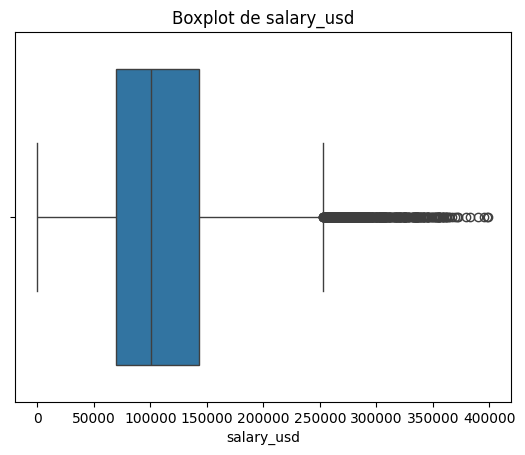

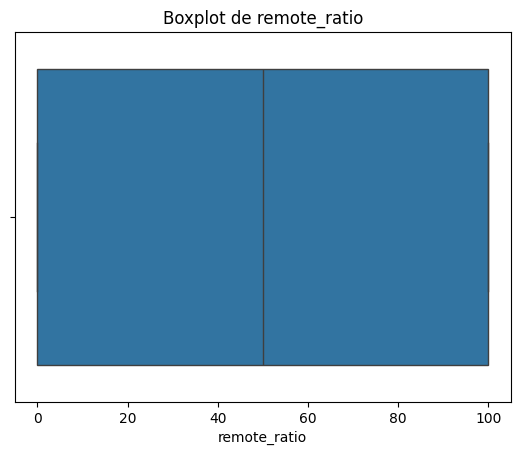

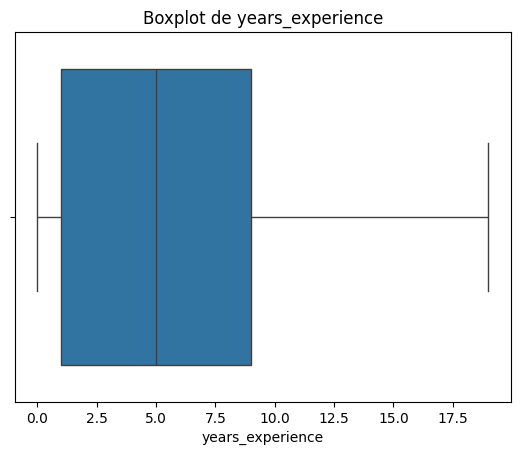

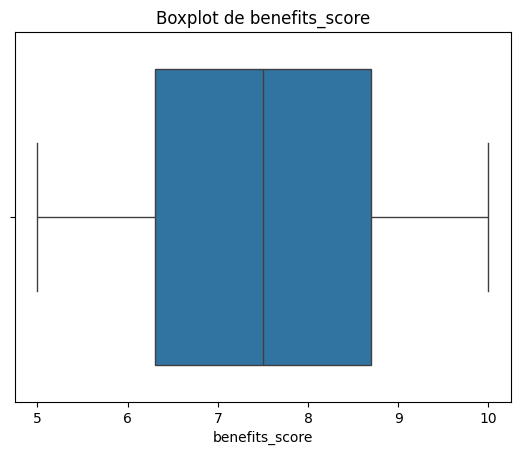

In [25]:
vari_num=df4.select_dtypes(include=['number']).columns
for q in vari_num:
    if q != 'job_description_length': #excluimos esta columna por tener muchos valores unicos 
        # y no tener relacion en este momento el analisis de la longitud de caracteres al solicitar el empleo
        fig = px.histogram(df4, x=q, nbins=30, title=f'Histograma de {q}', color=q)
        fig.update_layout(xaxis_title=q, yaxis_title='Frecuencia', bargap=0.05)
        fig.show()
        sns.boxplot(df4, x=q)
        plt.title(f'Boxplot de {q}')
        plt.show()



* Variables Categoricas

Usar gráficos de barras (sns.countplot()) para observar la frecuencia de cada
categoría.
Ejemplo:
“El 70% de los registros corresponden a la categoría ‘Masculino’, indicando un
dataset desbalanceado.”


C:\Users\danad\AppData\Local\Temp\ipykernel_18940\3996518235.py:7: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




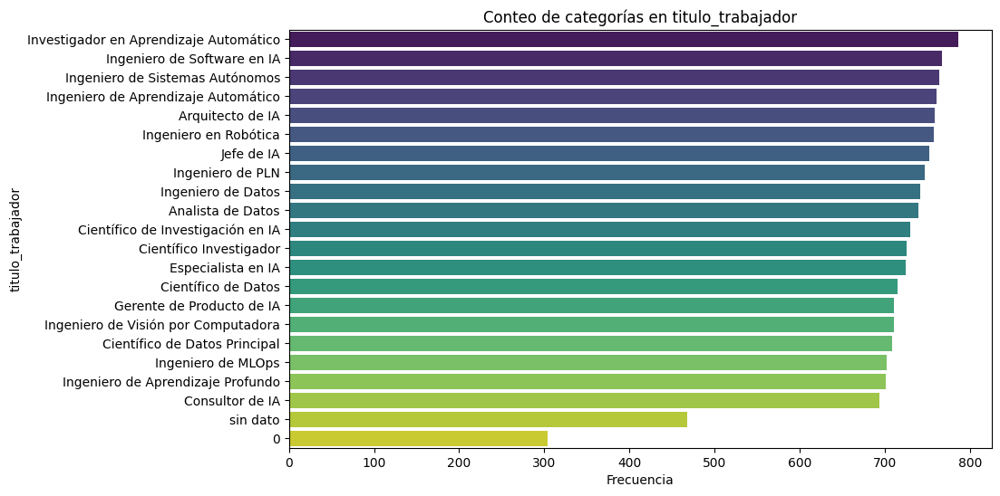

C:\Users\danad\AppData\Local\Temp\ipykernel_18940\3996518235.py:7: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




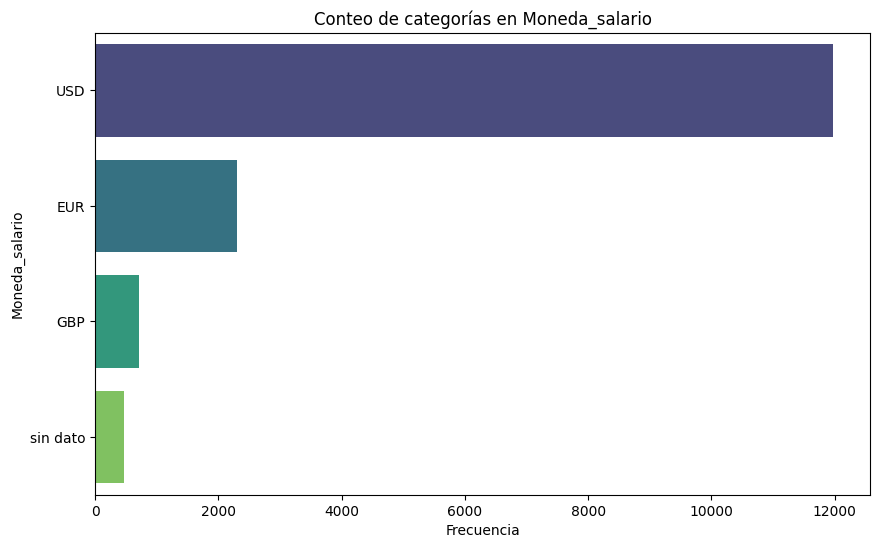

C:\Users\danad\AppData\Local\Temp\ipykernel_18940\3996518235.py:7: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




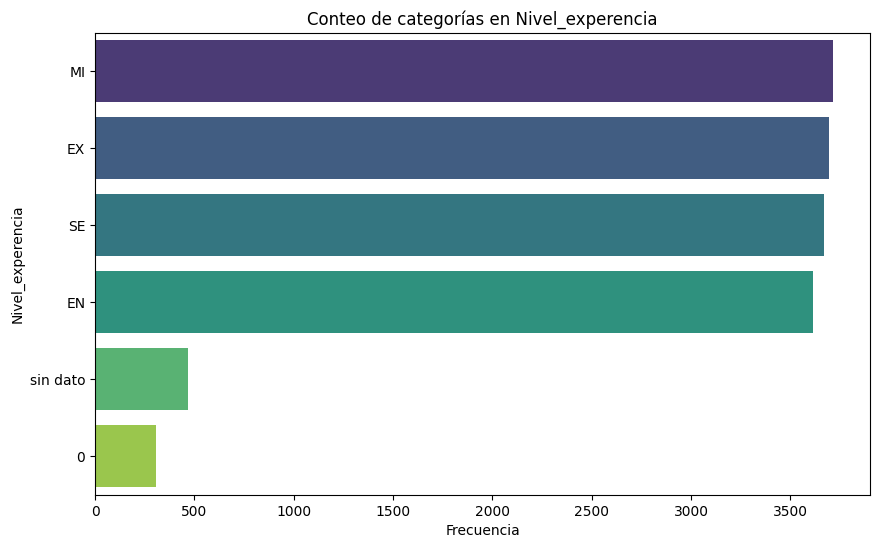

C:\Users\danad\AppData\Local\Temp\ipykernel_18940\3996518235.py:7: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




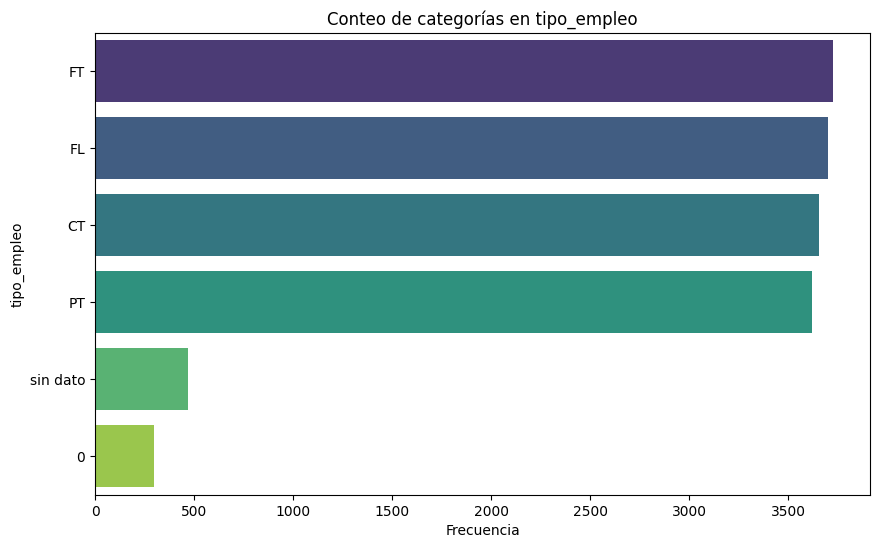

C:\Users\danad\AppData\Local\Temp\ipykernel_18940\3996518235.py:7: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




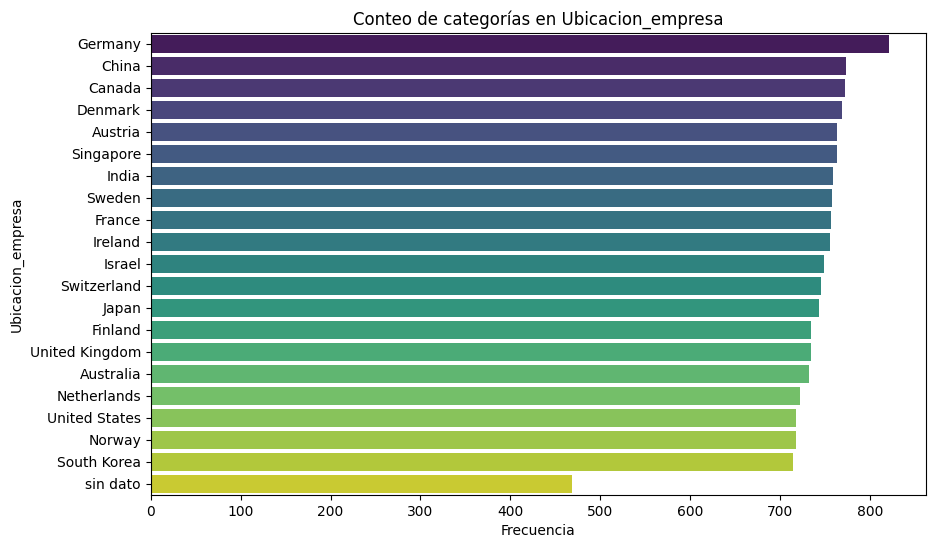

C:\Users\danad\AppData\Local\Temp\ipykernel_18940\3996518235.py:7: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




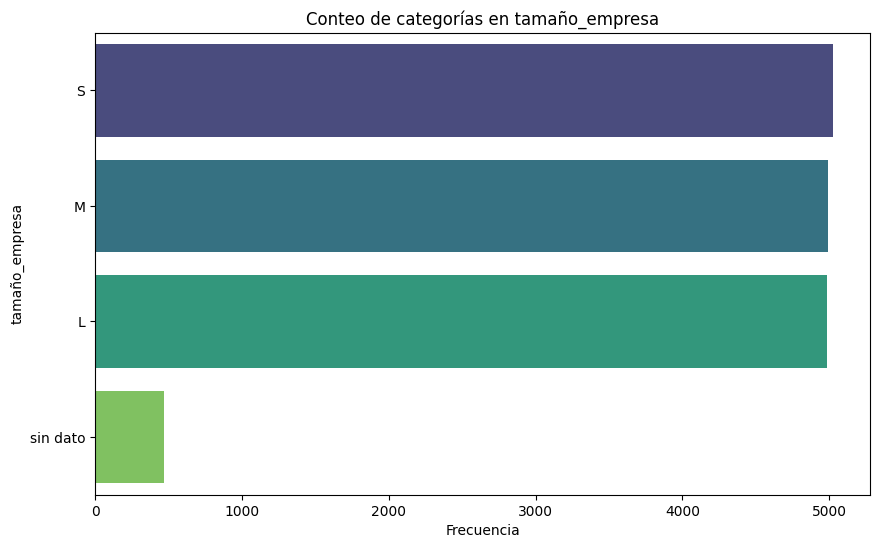

C:\Users\danad\AppData\Local\Temp\ipykernel_18940\3996518235.py:7: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




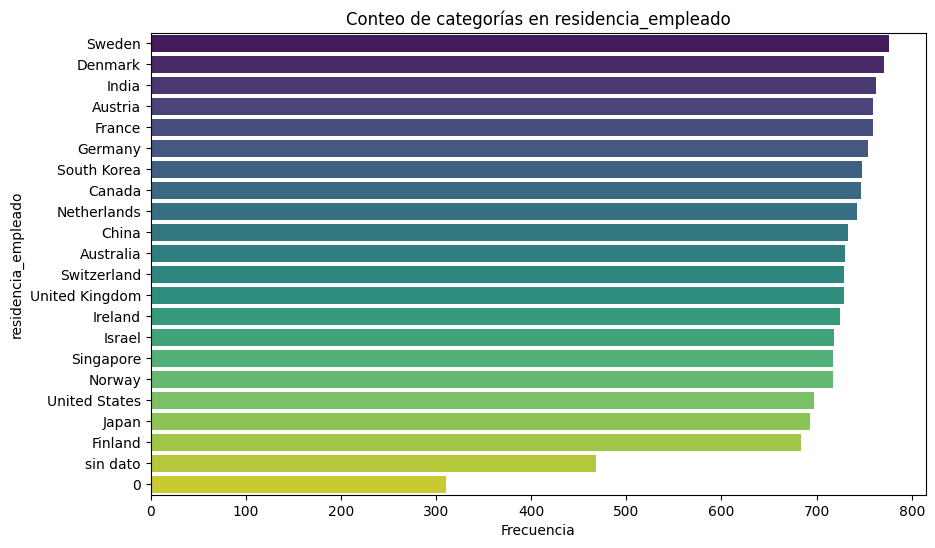

C:\Users\danad\AppData\Local\Temp\ipykernel_18940\3996518235.py:7: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




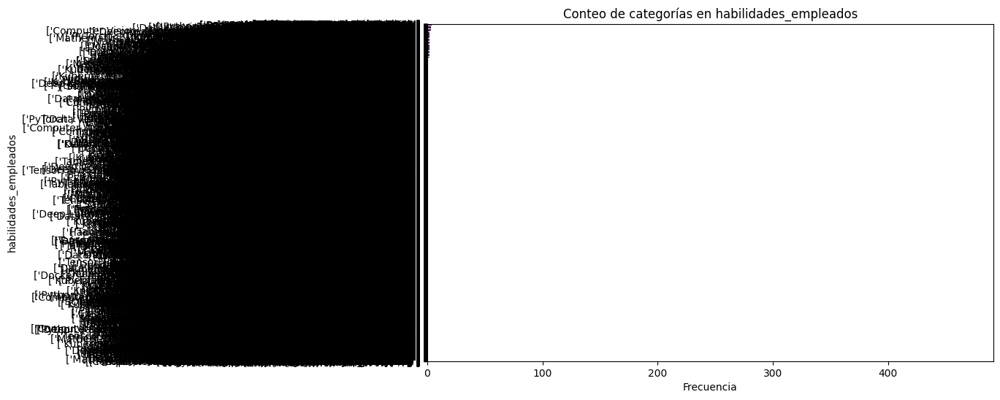

C:\Users\danad\AppData\Local\Temp\ipykernel_18940\3996518235.py:7: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




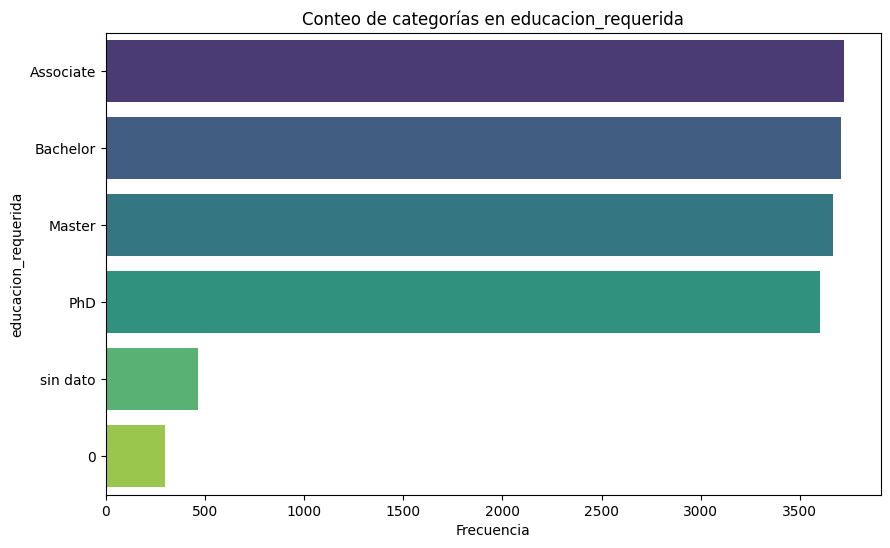

C:\Users\danad\AppData\Local\Temp\ipykernel_18940\3996518235.py:7: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




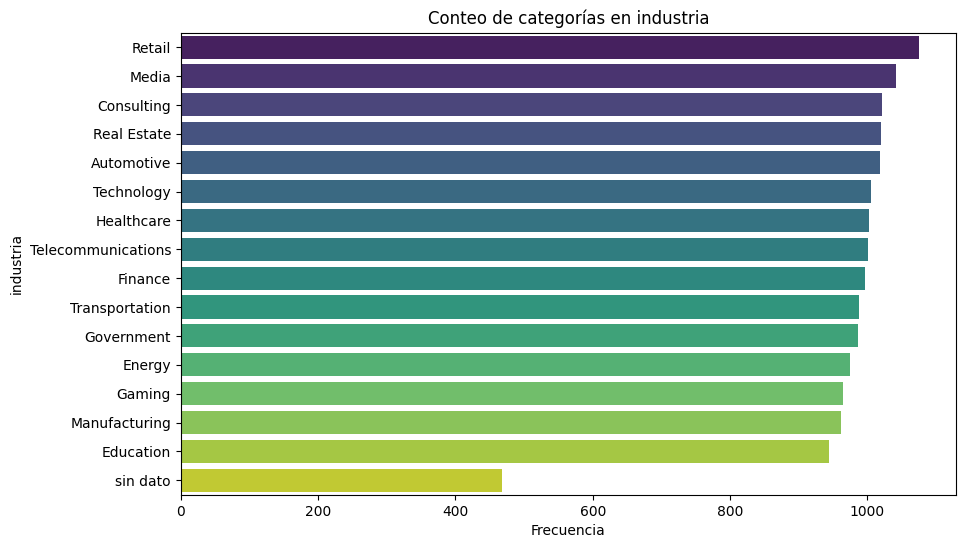

C:\Users\danad\AppData\Local\Temp\ipykernel_18940\3996518235.py:7: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




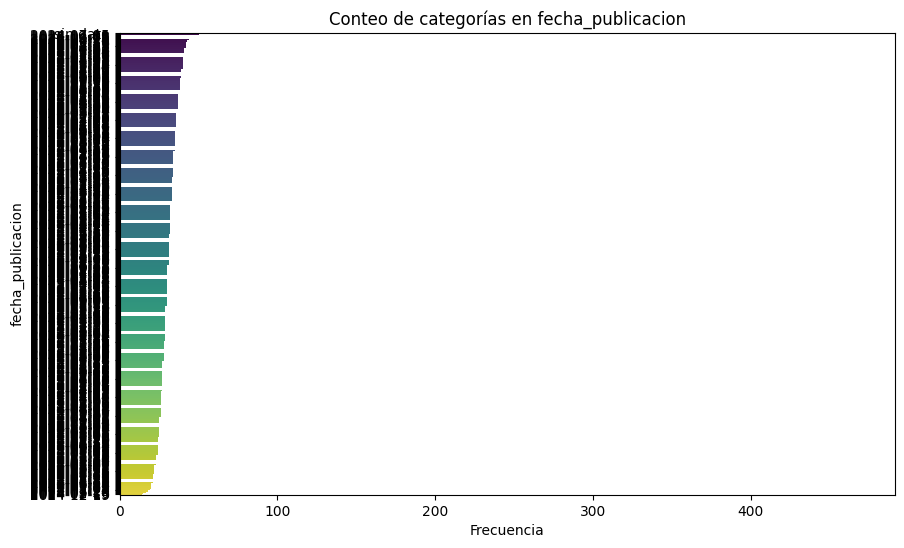

C:\Users\danad\AppData\Local\Temp\ipykernel_18940\3996518235.py:7: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




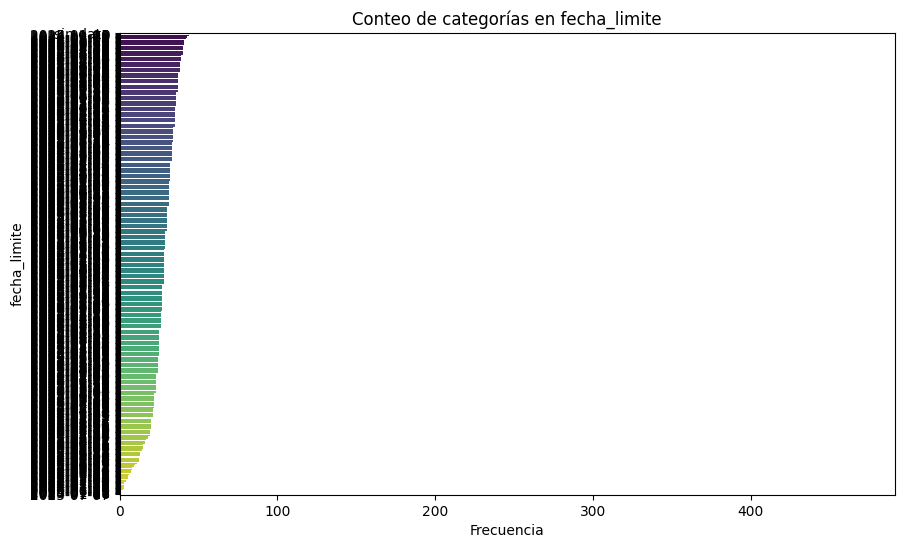

C:\Users\danad\AppData\Local\Temp\ipykernel_18940\3996518235.py:7: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




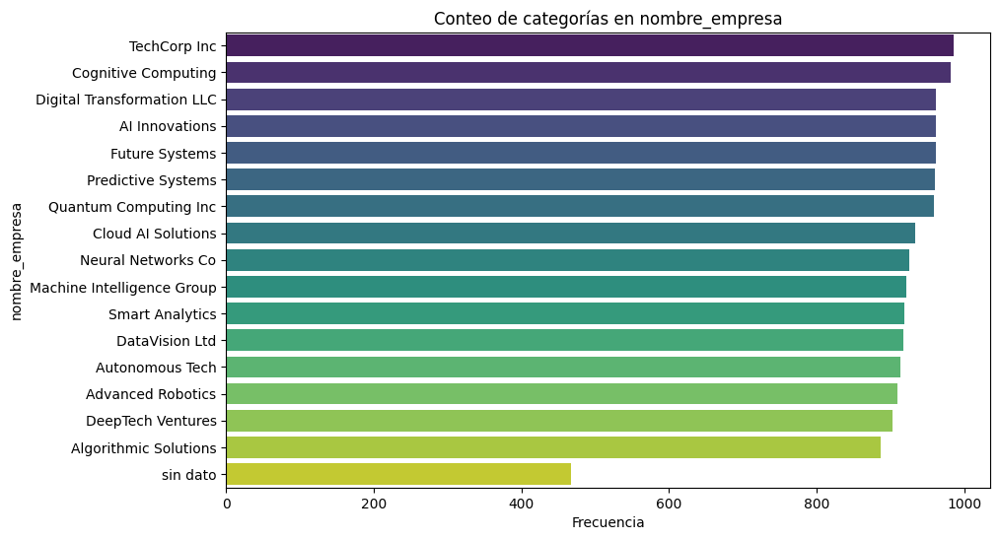

C:\Users\danad\AppData\Local\Temp\ipykernel_18940\3996518235.py:21: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




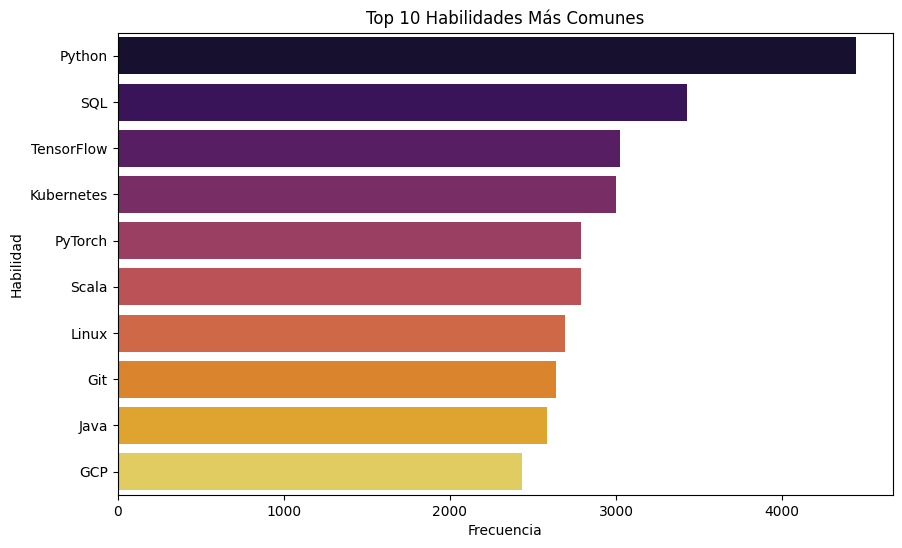

In [26]:
vari_cat=df4.select_dtypes(include=['object']).columns
for r in vari_cat:   
    if r != 'id_trabajor': #excluimos esta columna por tener muchos valores unicos 
        # y no tener relacion en este momento el analisis de la longitud de caracteres al solicitar el empleo
        # Grafico de barras para variables categoricas con sns.countplot
        plt.figure(figsize=(10, 6)) 
        sns.countplot(data=df4, y=r, order=df4[r].value_counts().index, palette='viridis')
        plt.title(f'Conteo de categorías en {r}')
        plt.xlabel('Frecuencia')
        plt.ylabel(r)
        plt.show()
#Para la grafica de barras para habilidades_empleados
#Separar las habilidades en listas individuales
habilidades_list = df4['habilidades_empleados'].explode()
#Contar la frecuencia de cada habilidad
habilidades_count = habilidades_list.value_counts()
#Seleccionar las 10 habilidades más comunes
top_habilidades = habilidades_count.head(10)
#Graficar las 10 habilidades más comunes
plt.figure(figsize=(10, 6))
sns.barplot(x=top_habilidades.values, y=top_habilidades.index, palette='inferno')
plt.title('Top 10 Habilidades Más Comunes')
plt.xlabel('Frecuencia')
plt.ylabel('Habilidad')
plt.show()


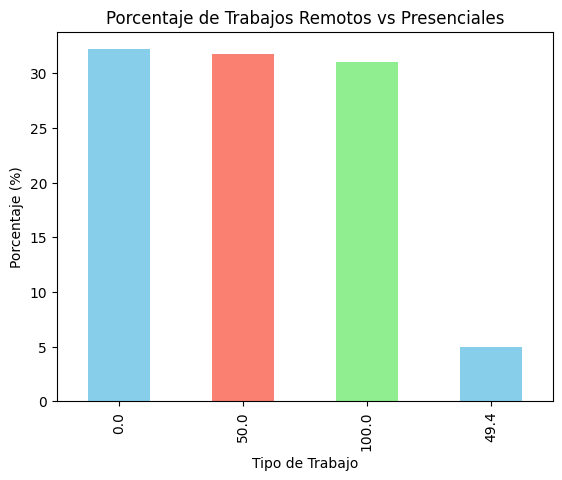

In [63]:
#Porcentaje de trabajos remotos vs presenciales
remote_counts = df4['remote_ratio'].value_counts(normalize=True) * 100
remote_counts.plot(kind='bar', color=['skyblue', 'salmon', 'lightgreen'])
plt.title('Porcentaje de Trabajos Remotos vs Presenciales')
plt.xlabel('Tipo de Trabajo')   
plt.ylabel('Porcentaje (%)')
plt.show()


* Correlacion de variables
* Matriz de correlacion

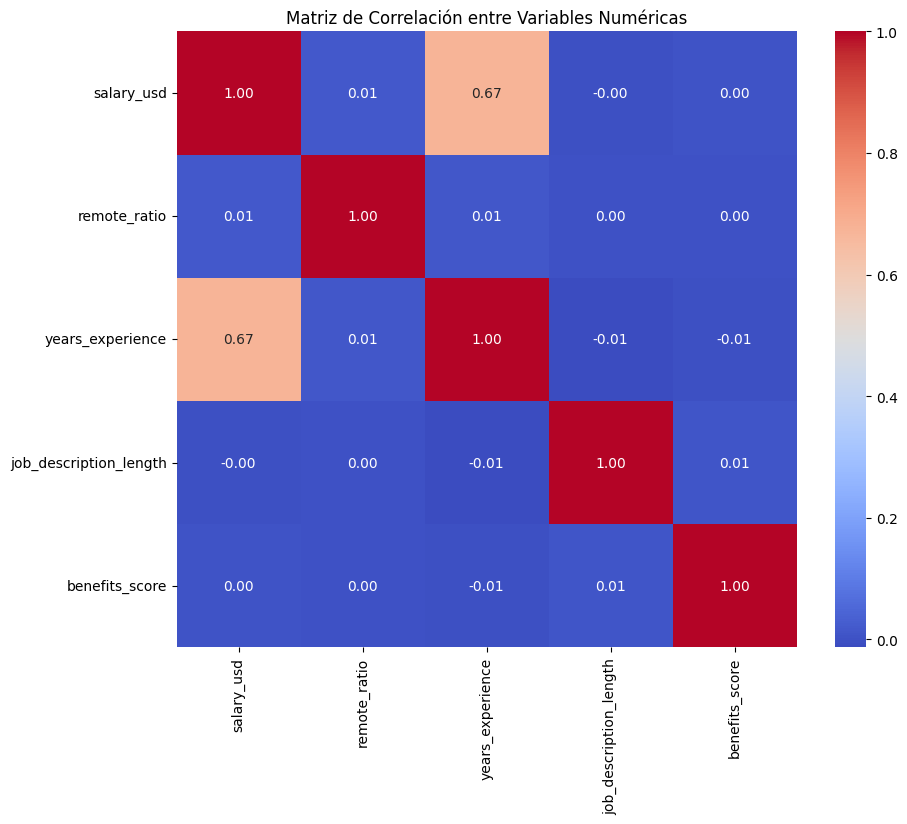

In [27]:
# Analisis de correlacion entre variables numericas
# Matriz de correlacion
#incluir un heatmap (sns.heatmap(df.corr, annot=True)))
#Analizar correlaciones altas(positivas y negativas), ejemplo: la variable salary_usd tiene una correlacion de 0.82 con years_experience lo que siguere una relacion directa
#excepto la variable id_trabajo
correlation_matrix = df4.select_dtypes(include=['number']).corr()
plt.figure(figsize=(10, 8)) 
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Matriz de Correlación entre Variables Numéricas')
plt.show()

* Parejas de variables:
* salario vs años de experencia 
* salario vs nivel de exp
* salario vs relacion remota
* salario vs puntuacion de beneficios
* años de experencia vs nivel de experencia 

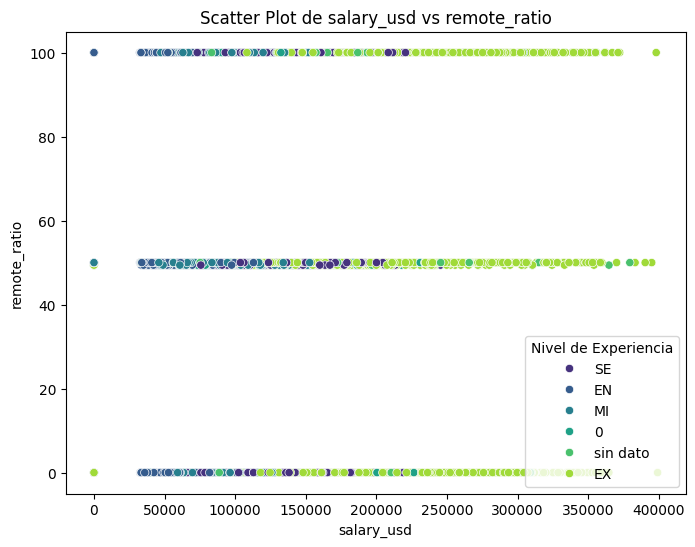

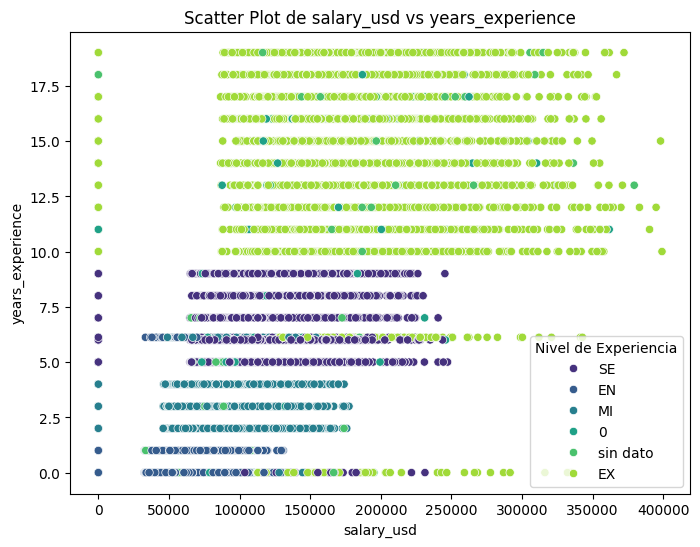

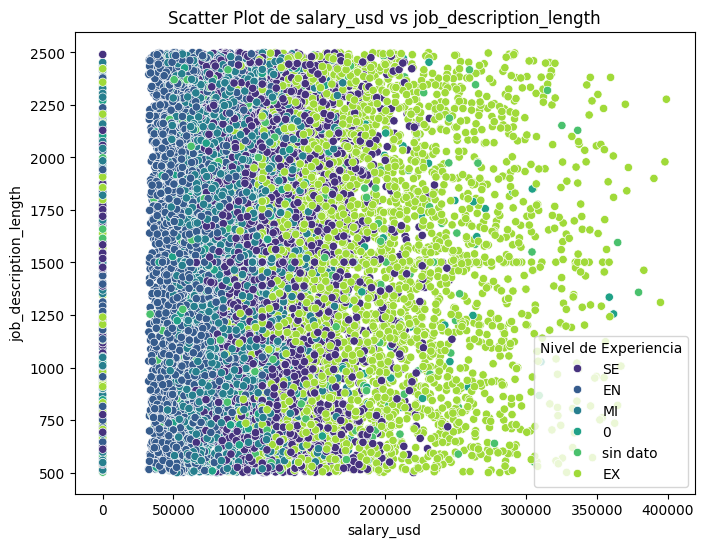

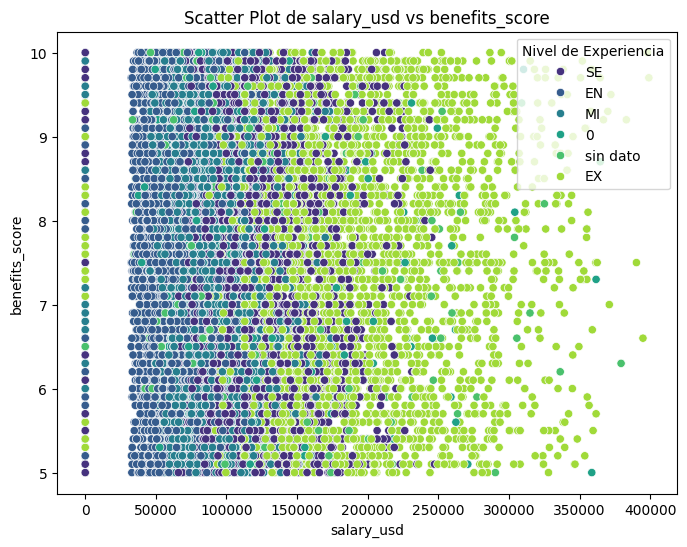

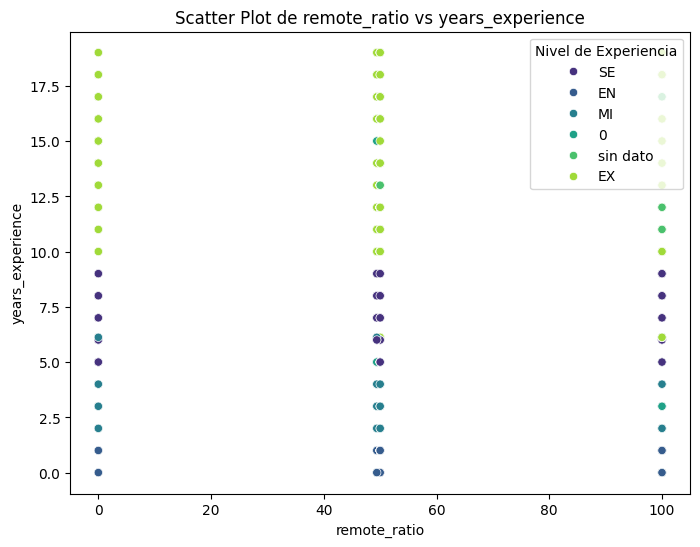

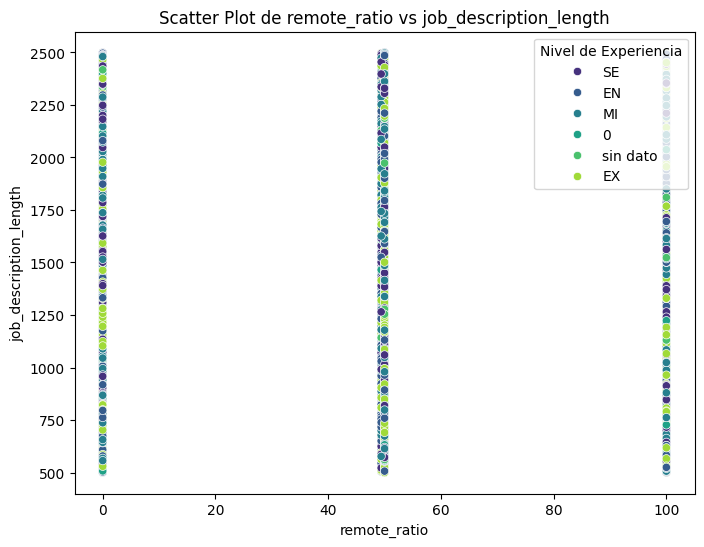

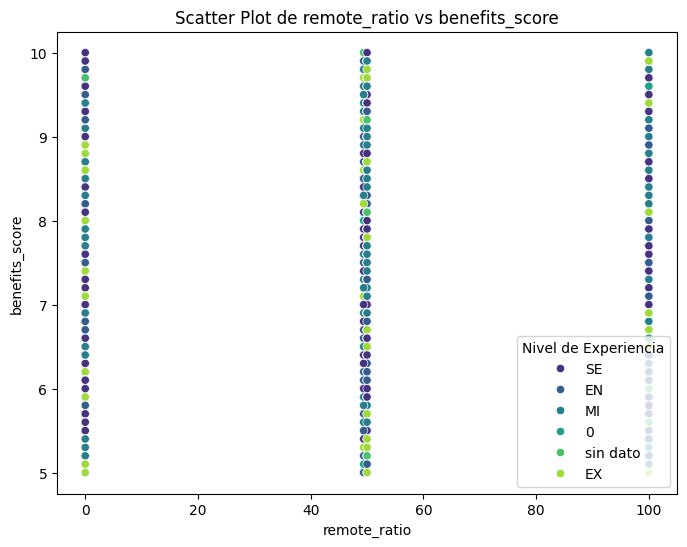

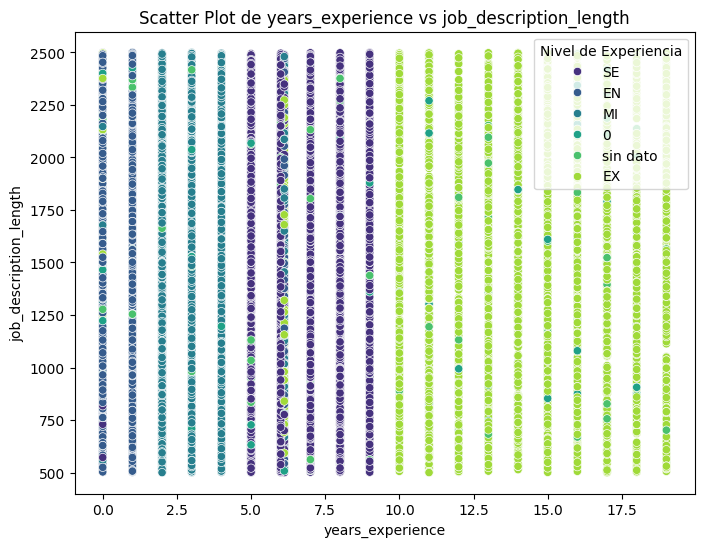

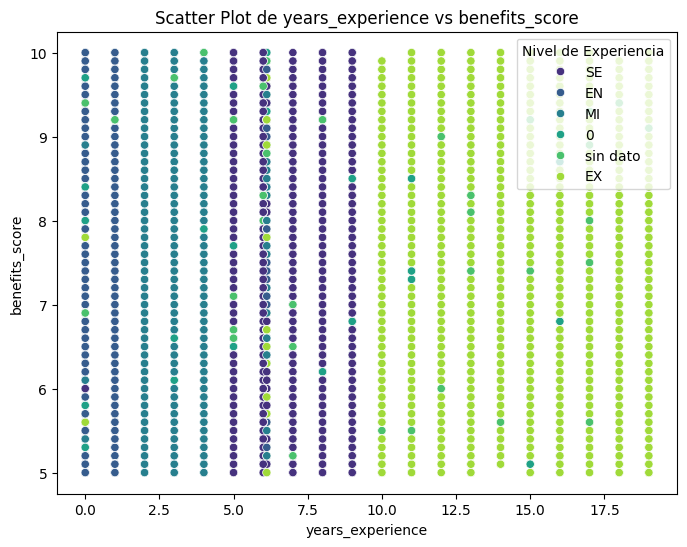

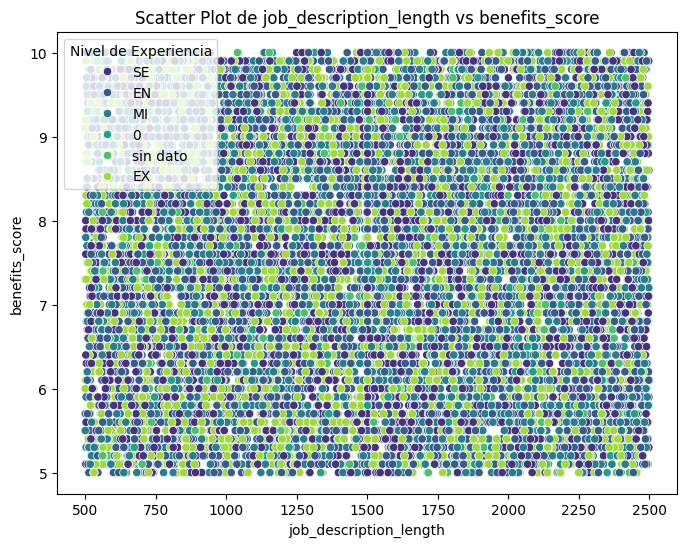

In [28]:
#Analisis de parejas de variables numericas con scatter plot
numerical_columns = df4.select_dtypes(include=['number']).columns
for i in range(len(numerical_columns)):
    for j in range(i + 1, len(numerical_columns)):
        plt.figure(figsize=(8, 6))
        sns.scatterplot(data=df4, x=numerical_columns[i], y=numerical_columns[j], hue='Nivel_experencia', palette='viridis')
        plt.title(f'Scatter Plot de {numerical_columns[i]} vs {numerical_columns[j]}')
        plt.xlabel(numerical_columns[i])
        plt.ylabel(numerical_columns[j])
        plt.legend(title='Nivel de Experiencia')
        plt.show()

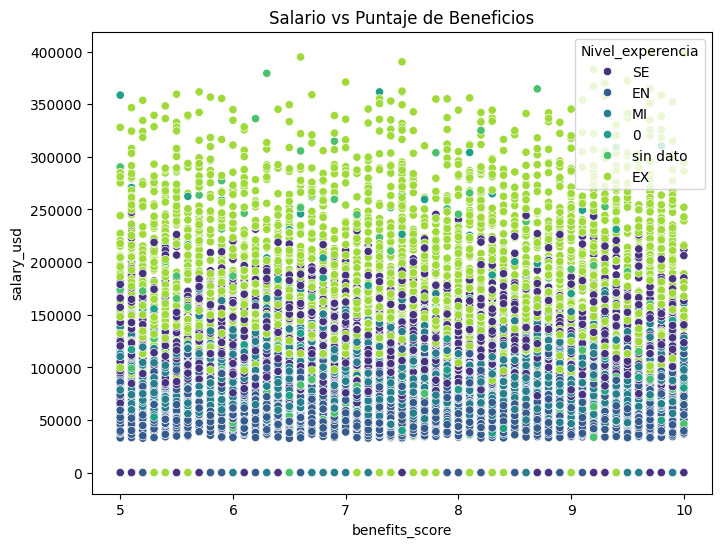

In [52]:
#Grafico de despersion , salrio vs puntaje de beneficios
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df4, x='benefits_score', y='salary_usd', hue='Nivel_experencia', palette='viridis')
plt.title('Salario vs Puntaje de Beneficios')
plt.show()


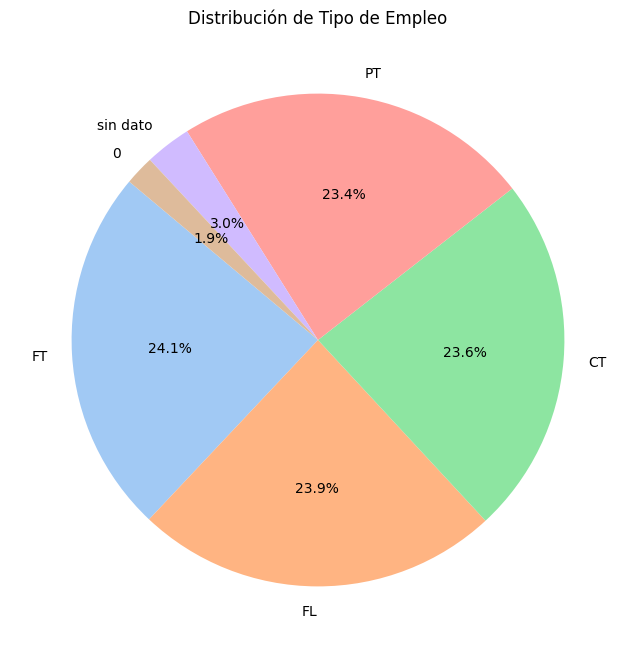

In [53]:
#Grafico de pastel de tipo de empleo
tipo_empleo_counts = df4['tipo_empleo'].value_counts()
plt.figure(figsize=(8, 8))
plt.pie(tipo_empleo_counts, labels=tipo_empleo_counts.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette('pastel'))
plt.title('Distribución de Tipo de Empleo') 
plt.show()

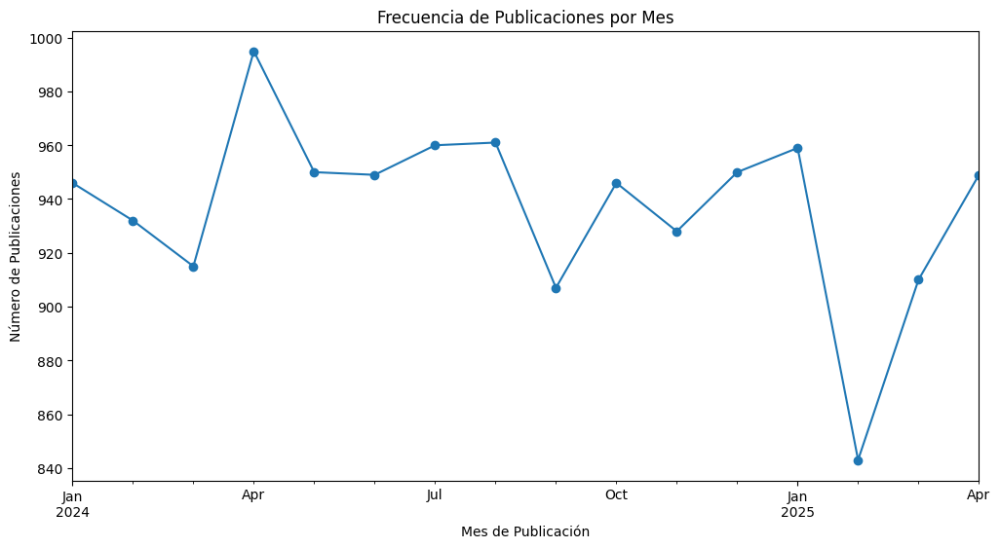

In [73]:
#Grafica de lineas, de fechas de publicacion por meses  y su frecuencia
#Para agregar paletas de colores se añade palette= 'nombre de la paleta' dentro del plot, despues de 
df4['fecha_publicacion'] = pd.to_datetime(df4['fecha_publicacion'], errors='coerce')
df4['mes_publicacion'] = df4['fecha_publicacion'].dt.to_period('M')
frecuencia_mensual = df4['mes_publicacion'].value_counts().sort_index() 
plt.figure(figsize=(12, 6))
frecuencia_mensual.plot(kind='line', marker='o')    
plt.title('Frecuencia de Publicaciones por Mes')
plt.xlabel('Mes de Publicación')    
plt.ylabel('Número de Publicaciones')
plt.show()


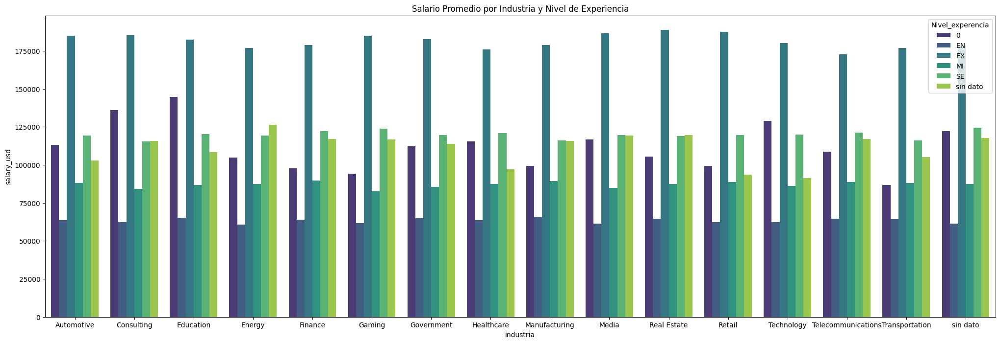

In [59]:
#Salario Promedio por industria y nivel de experiencia
#pARA VER MEJOR LAS INDUCTRIAS SE CAMBIA LA FIGURE SIZE
salario_promedio_industria = df4.groupby(['industria', 'Nivel_experencia'])['salary_usd'].mean().reset_index()
plt.figure(figsize=(25, 8))
sns.barplot(data=salario_promedio_industria, x='industria', y='salary_usd', hue='Nivel_experencia', palette='viridis')
plt.title('Salario Promedio por Industria y Nivel de Experiencia')
plt.show()

In [61]:
#mAPA colopletico por ubicacion y tipo de empleo
import geopandas as gpd
# Cargar el GeoDataFrame del mundo
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
# Contar la cantidad de empleos por ubicación de la empresa
ubicacion_counts = df4['Ubicacion_empresa'].value_counts().reset_index()
ubicacion_counts.columns = ['Ubicacion_empresa', 'cantidad_empleos']
# Unir los datos de ubicación con el GeoDataFrame del mundo
world_ubicacion = world.merge(ubicacion_counts, left_on='name', right_on='Ubicacion_empresa', how='left')
# Graficar el mapa coroplético
fig, ax = plt.subplots(1, 1, figsize=(15, 10))
world_ubicacion.plot(column='cantidad_empleos', ax=ax, legend=True, cmap='OrRd', missing_kwds={'color': 'lightgrey'})
ax.set_title('Cantidad de Empleos por Ubicación de la Empresa') 
plt.show()


AttributeError: The geopandas.dataset has been deprecated and was removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.

# 4. Analisis de valores atípicos
* identificación:

In [29]:
#Usando metricas estadisticas como el rango intercuartilico (IQR) para identificar outliers en las variables numericas
vari_num=df4.select_dtypes(include=['number']).columns
for col in vari_num:
    Q1 = df4[col].quantile(0.25)
    Q3 = df4[col].quantile(0.75)
    IQR = Q3 - Q1
    mini = Q1 - 1.5 * IQR
    maxi = Q3 + 1.5 * IQR
    outliers = df4[(df4[col] < mini) | (df4[col] > maxi)]
    print(f'En la variable {col}, hay {outliers.shape[0]} outliers')

En la variable salary_usd, hay 551 outliers
En la variable remote_ratio, hay 0 outliers
En la variable years_experience, hay 0 outliers
En la variable job_description_length, hay 0 outliers
En la variable benefits_score, hay 0 outliers


Vemos que la variable salary_usd tiene la mayor cantidad de outliers, con un total de 1432 registros que se encuentran fuera del rango intercuartilico.
sin embargo, no se eliminan en este momento ya que pueden ser datos validos dependiendo del contexto del empleo y la industria


# 5. Analisis de Valores Faltantes

* Identifica valores

In [30]:
#Identifica valores faltantes
valores_faltantes = df4.isnull().sum()
val_faltantes_porcentaje = (valores_faltantes / df4.shape[0]) * 100
print("Tabla de Valores Faltantes y su Porcentaje:")
valores_faltantes_df = pd.DataFrame({'Valores Faltantes': valores_faltantes, 'Porcentaje (%)': val_faltantes_porcentaje})
valores_faltantes_df 


Tabla de Valores Faltantes y su Porcentaje:


,Valores Faltantes,Porcentaje (%)
id_trabajor,0,0.0
titulo_trabajador,0,0.0
salary_usd,0,0.0
Moneda_salario,0,0.0
Nivel_experencia,0,0.0
tipo_empleo,0,0.0
Ubicacion_empresa,0,0.0
tamaño_empresa,0,0.0
residencia_empleado,0,0.0
remote_ratio,0,0.0


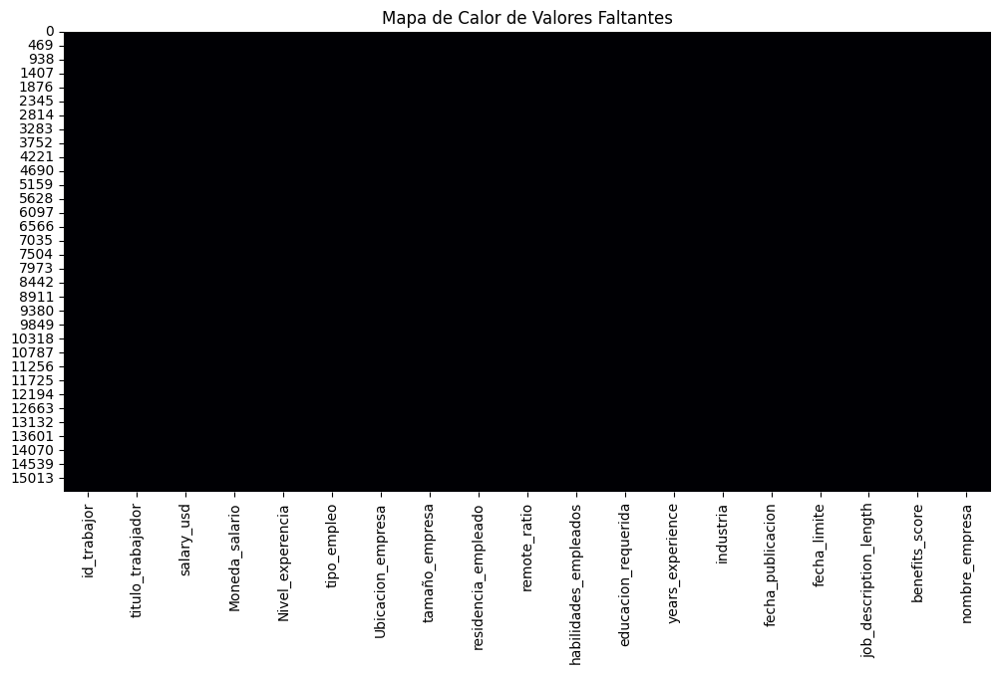

In [31]:
#Visualizacion de valores faltantes con un heatmap
plt.figure(figsize=(12, 6))
sns.heatmap(df4.isnull(), cbar=False, cmap='inferno')
plt.title('Mapa de Calor de Valores Faltantes')
plt.show()  

* Estrategias de imputacion: 
(media o mediana)
(moda)

In [32]:
#Estrategia de imputacion para valores faltantes
#Para las variables numericas se usara la media para rellenar los valores faltantes
#Para las variables categoricas se usara la moda para rellenar los valores faltantes
for col in df4.select_dtypes(include=['number']).columns:
    media = df4[col].mean()
    df4[col] = df4[col].fillna(media)
    print(f'Para la variable {col} los valores nulos son remplazados por {media}')

Para la variable salary_usd los valores nulos son remplazados por 112960.55148694079
Para la variable remote_ratio los valores nulos son remplazados por 49.397944142746326
Para la variable years_experience los valores nulos son remplazados por 6.117995862425653
Para la variable job_description_length los valores nulos son remplazados por 1501.4730727954488
Para la variable benefits_score los valores nulos son remplazados por 7.498151021463666


# 6. Relación entre variables categóricas y numéricas

C:\Users\danad\AppData\Local\Temp\ipykernel_18940\3460031489.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




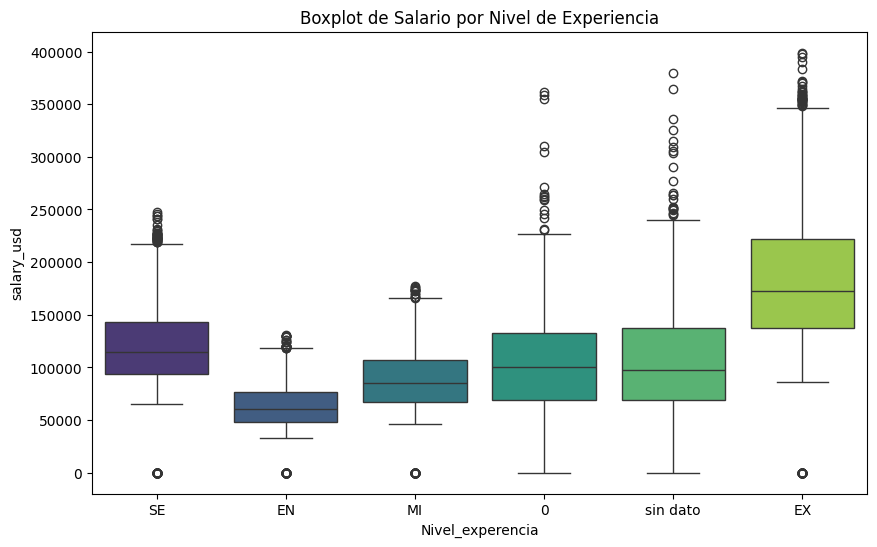

In [33]:
#Comparar una variable numerica con categorica
#Usar sns.boxplot
plt.figure(figsize=(10, 6))
sns.boxplot(data=df4, x='Nivel_experencia', y='salary_usd', palette='viridis')
plt.title('Boxplot de Salario por Nivel de Experiencia')
plt.show()

C:\Users\danad\AppData\Local\Temp\ipykernel_18940\3518490726.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




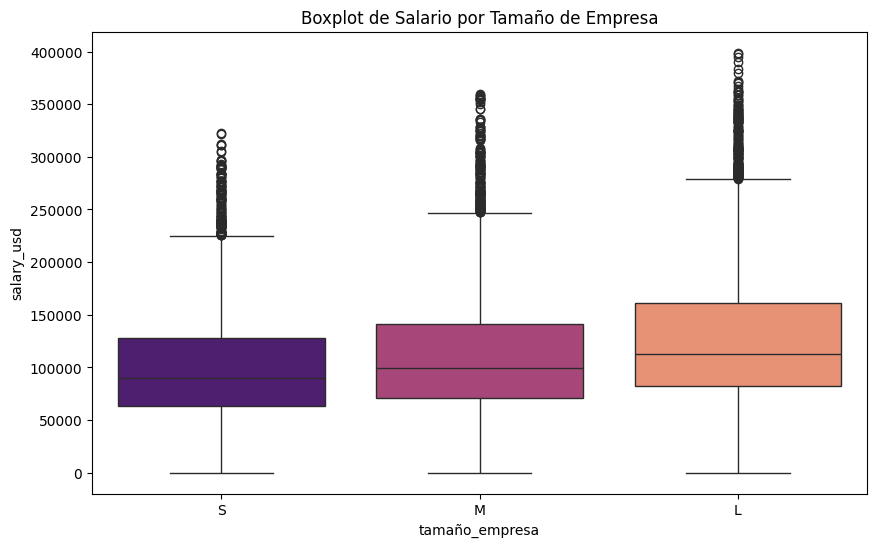

In [34]:
#Analisis de salario y tamaño de empresa
plt.figure(figsize=(10, 6))
sns.boxplot(data=df4, x='tamaño_empresa', y='salary_usd',
            order=['S', 'M', 'L'], palette='magma')
plt.title('Boxplot de Salario por Tamaño de Empresa')
plt.show()

C:\Users\danad\AppData\Local\Temp\ipykernel_18940\1086955560.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




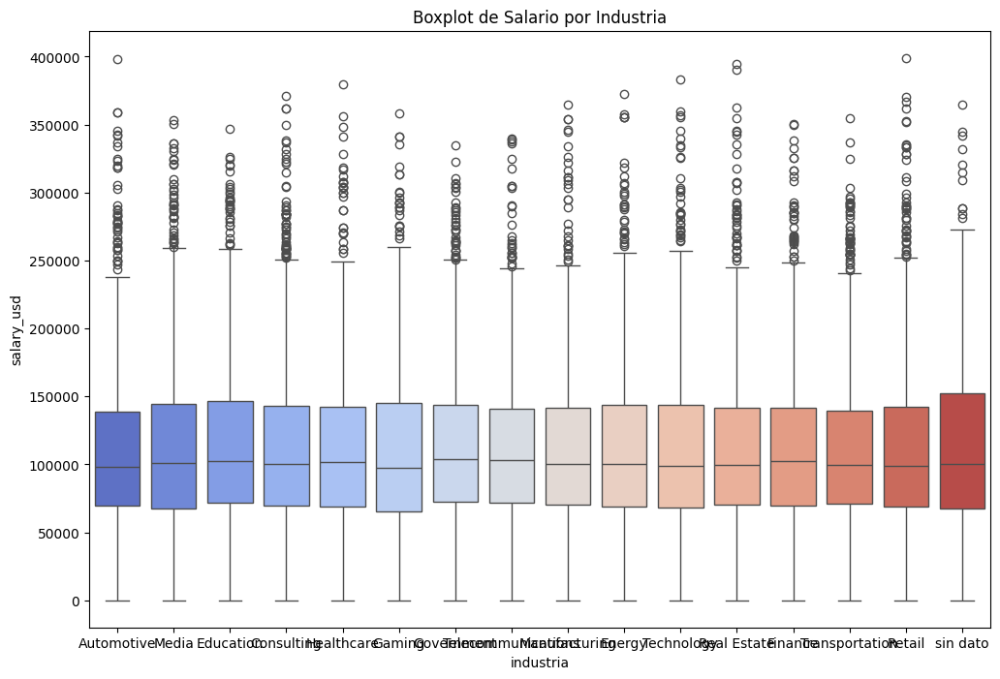

In [35]:
#Analisis industria y salario
plt.figure(figsize=(12, 8))
sns.boxplot(data=df4, x='industria', y='salary_usd', palette='coolwarm')
plt.title('Boxplot de Salario por Industria')
plt.show()

C:\Users\danad\AppData\Local\Temp\ipykernel_18940\1605278253.py:9: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




<Figure size 1200x800 with 0 Axes>

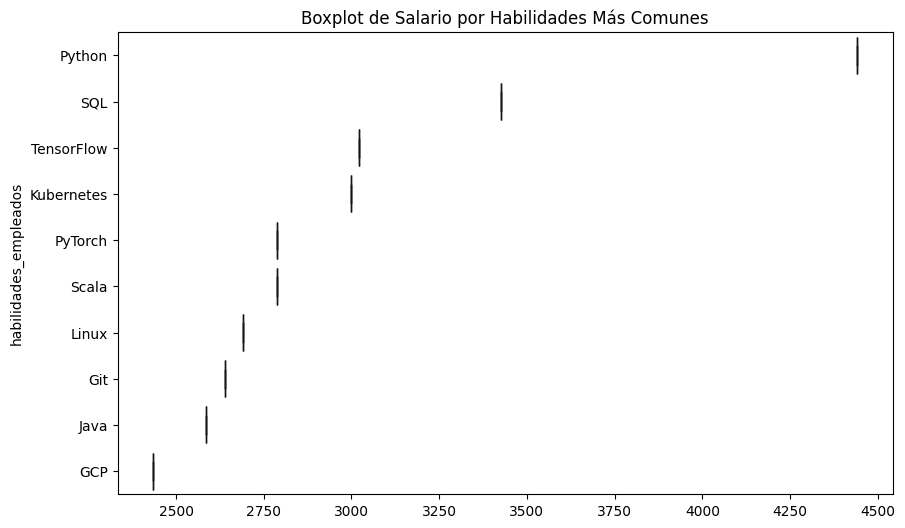

In [36]:
#Analisis habilidades y salario
plt.figure(figsize=(12, 8))
#Se separan las habilidades en listas individuales
habilidades_list = df4.explode('habilidades_empleados')
#Se cuenta la frecuencia de cada habilidad para crear el boxplot
habilidades_count = habilidades_list['habilidades_empleados'].value_counts()
top_habilidades = habilidades_count.head(10)
plt.figure(figsize=(10, 6))
sns.boxplot(x=top_habilidades.values, y=top_habilidades.index, palette='inferno')
plt.title('Boxplot de Salario por Habilidades Más Comunes')
plt.show()

C:\Users\danad\AppData\Local\Temp\ipykernel_18940\1312680811.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




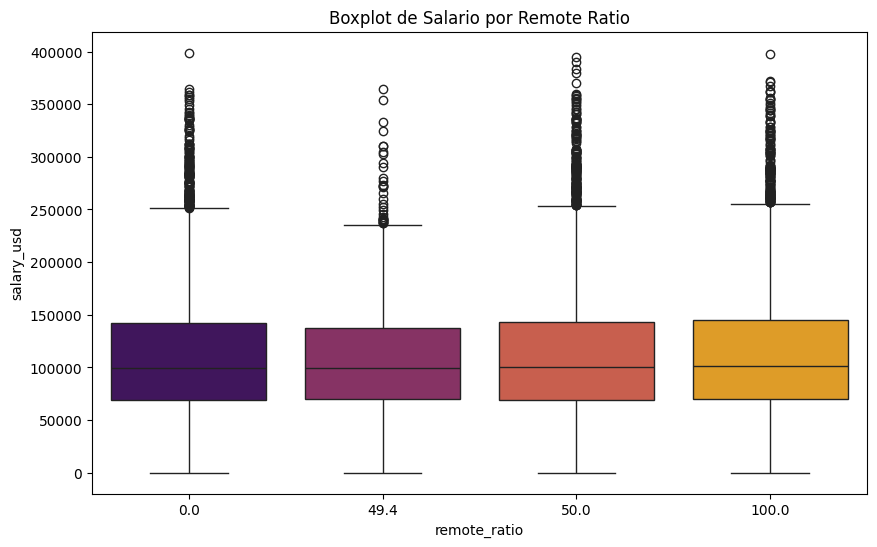

In [37]:
#Analisis de salario y remote_ratio en boxplot
plt.figure(figsize=(10, 6))
sns.boxplot(data=df4, x='remote_ratio', y='salary_usd', palette='inferno')
plt.title('Boxplot de Salario por Remote Ratio')
plt.show()

C:\Users\danad\AppData\Local\Temp\ipykernel_18940\762091818.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




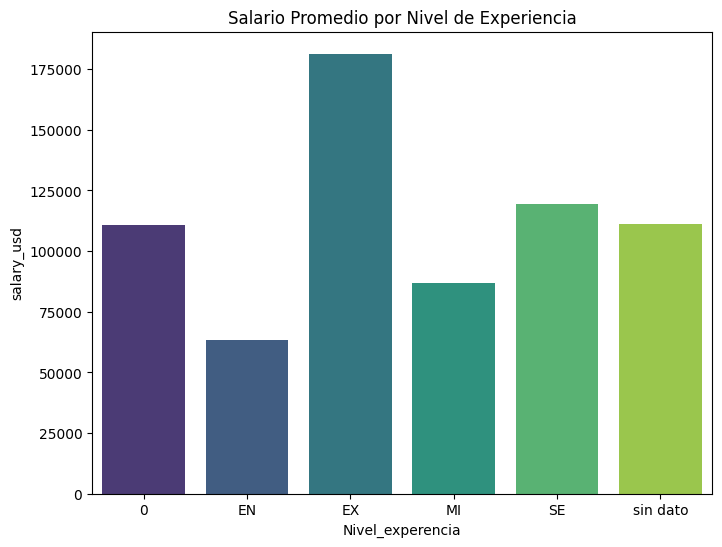

In [51]:
#Grafica de barras de salario promedio por nivel de experiencia
salario_promedio_nivel = df4.groupby('Nivel_experencia')['salary_usd'].mean().reset_index()
plt.figure(figsize=(8, 6))
sns.barplot(data=salario_promedio_nivel, x='Nivel_experencia', y='salary_usd', palette='viridis')
plt.title('Salario Promedio por Nivel de Experiencia')
plt.show()


# 7.Observaciones y Hallazgos importantes
- en el pdf


## MODELO MACHINE LEARNING

In [38]:
# División 80% Entrenamiento, 20% Prueba
from sklearn.model_selection import train_test_split

X = df4.drop('salary_usd', axis=1)
y = df4['salary_usd']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)
print(f"Tamaño del conjunto de entrenamiento: {X_train.shape[0]} registros")

Tamaño del conjunto de entrenamiento: 12374 registros


In [39]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score


In [40]:
#Se crea una copia del ultimo data set en este caso df4 pasa a df5
df5 = df4.copy()
#Para el modelo eliminamos columnas que no aportan informacion relevante o que pueden generar ruido
df5 = df5.drop(columns=['id_trabajor', 'nombre_empresa', 'fecha_publicacion', 'fecha_limite', 'titulo_trabajador', 'habilidades_empleados'])
#Separamos las variables independientes de la dependiente
X = df5.drop('salary_usd', axis=1)
y = df5['salary_usd']
#Dividimos los datos en conjuntos de entrenamiento y prueba
#con 80%el modelo y 20% para proueba
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42)
X_train = pd.get_dummies(X_train, drop_first=True)
#Entrenar el modelo de Random Forest Regressor
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)
X_test = X_test.reindex(columns=X_train.columns, fill_value=0)
#Hacer predicciones
y_pred = model.predict(X_test)
eam=mean_absolute_error(y_test, y_pred)
ecm=mean_squared_error(y_test, y_pred) 
r2=r2_score(y_test, y_pred)

In [41]:
#Print de las metricas de evaluacion del modelo
print("Error absoluto medio (EAM)):", eam)
print("Error cuadratico medio(ECM):", ecm)
print("R²:", r2)

Error absoluto medio (EAM)): 41662.63559592223
Error cuadratico medio(ECM): 2628731177.350385
R²: 0.2939630950287263


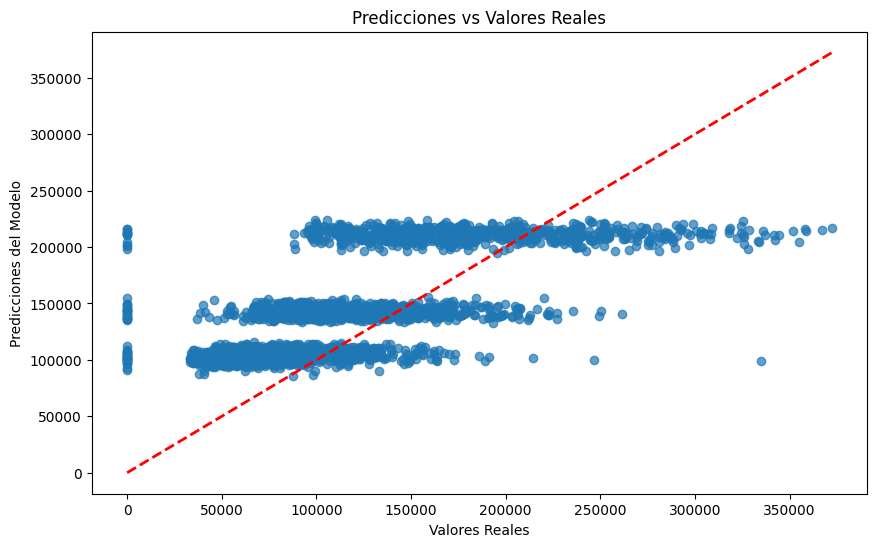

In [42]:
#Graficar las predicciones vs los valores reales
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.7)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.xlabel('Valores Reales')
plt.ylabel('Predicciones del Modelo')
plt.title('Predicciones vs Valores Reales')
plt.show()

Fitting 3 folds for each of 24 candidates, totalling 72 fits
Mejor modelo - Error absoluto medio (EAM): 41493.14401010826
Mejor modelo - Error cuadratico medio (ECM): 2623313963.8841515
Mejor modelo - R²: 0.2954180755388003


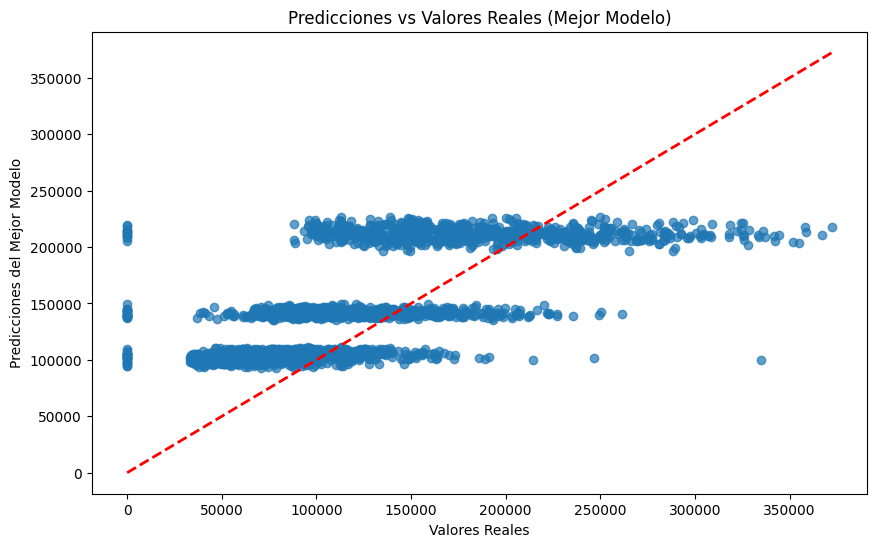

In [44]:
#nos damos cunta que el modelo no es muy preciso, por lo que se puede mejorar con tecnicas de optimizacion de hiperparametros y seleccion de variables
# Grid Search para optimización de hiperparámetros
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}
grid_search = GridSearchCV(estimator=RandomForestRegressor(random_state=42),
                           param_grid=param_grid,
                            cv=3,   
                            n_jobs=-1,
                            verbose=2)
grid_search.fit(X_train, y_train)
best_model = grid_search.best_estimator_
y_pred_best = best_model.predict(X_test)
eam_best = mean_absolute_error(y_test, y_pred_best)
ecm_best = mean_squared_error(y_test, y_pred_best)
r2_best = r2_score(y_test, y_pred_best)     
#Print de las metricas de evaluacion del mejor modelo
print("Mejor modelo - Error absoluto medio (EAM):", eam_best)
print("Mejor modelo - Error cuadratico medio (ECM):", ecm_best)
print("Mejor modelo - R²:", r2_best)
#Graficar las predicciones vs los valores reales del mejor modelo
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_best, alpha=0.7)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.xlabel('Valores Reales')
plt.ylabel('Predicciones del Mejor Modelo')
plt.title('Predicciones vs Valores Reales (Mejor Modelo)')
plt.show()


In [45]:
#ajustes de hiperparametros con GridSearchCV
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}
grid_search = GridSearchCV(estimator=RandomForestRegressor(random_state=42),
                           param_grid=param_grid,
                            cv=3,
                            n_jobs=-1,
                            verbose=2)
grid_search.fit(X_train, y_train)
best_model = grid_search.best_estimator_
y_pred_best = best_model.predict(X_test)
eam_best = mean_absolute_error(y_test, y_pred_best)
ecm_best = mean_squared_error(y_test, y_pred_best)
r2_best = r2_score(y_test, y_pred_best)
print("Mejores Hiperparámetros:", grid_search.best_params_)
print("Error absoluto medio (EAM) con mejores hiperparámetros:", eam_best)
print("Error cuadrático medio (ECM) con mejores hiperparámetros:", ecm_best)
print("R² con mejores hiperparámetros:", r2_best)


Fitting 3 folds for each of 108 candidates, totalling 324 fits


KeyboardInterrupt: 

C:\Users\danad\AppData\Local\Temp\ipykernel_18940\936297843.py:8: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




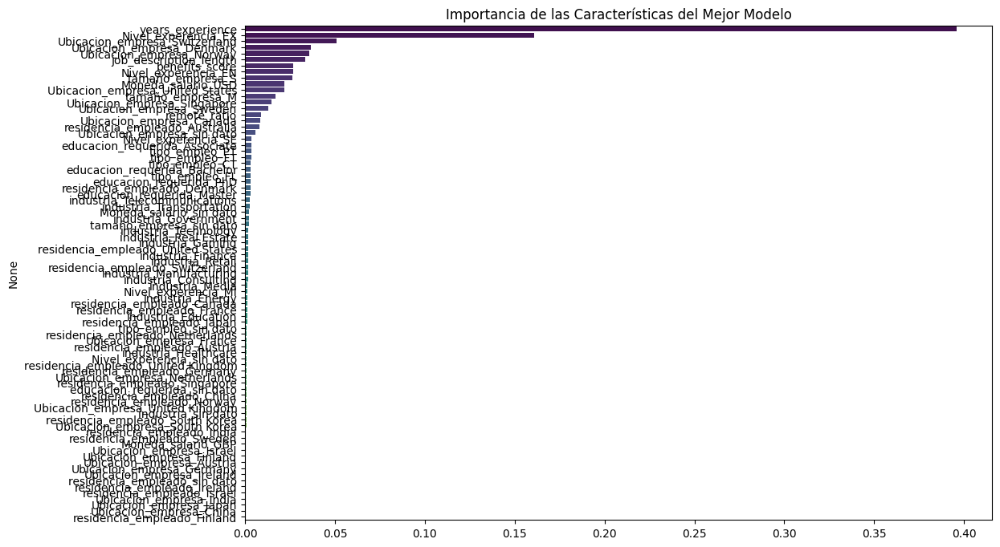

In [48]:
#Visualizar la importancia de las características
importances = best_model.feature_importances_
feature_names = X_train.columns
feature_importances = pd.Series(importances, index=feature_names).sort_values(ascending=False)
#Graficar la importancia de las características 
#Mas espaciado para mejor visualizacion
plt.figure(figsize=(12, 8))
sns.barplot(x=feature_importances.values, y=feature_importances.index, palette='viridis')
plt.title('Importancia de las Características del Mejor Modelo')
plt.show()


Top 10 características más importantes:
years_experience                 0.395835
Nivel_experencia_EX              0.160786
Ubicacion_empresa_Switzerland    0.050869
Ubicacion_empresa_Denmark        0.036470
Ubicacion_empresa_Norway         0.035879
job_description_length           0.033456
benefits_score                   0.026826
Nivel_experencia_EN              0.026739
tamaño_empresa_S                 0.026353
Moneda_salario_USD               0.021761
dtype: float64


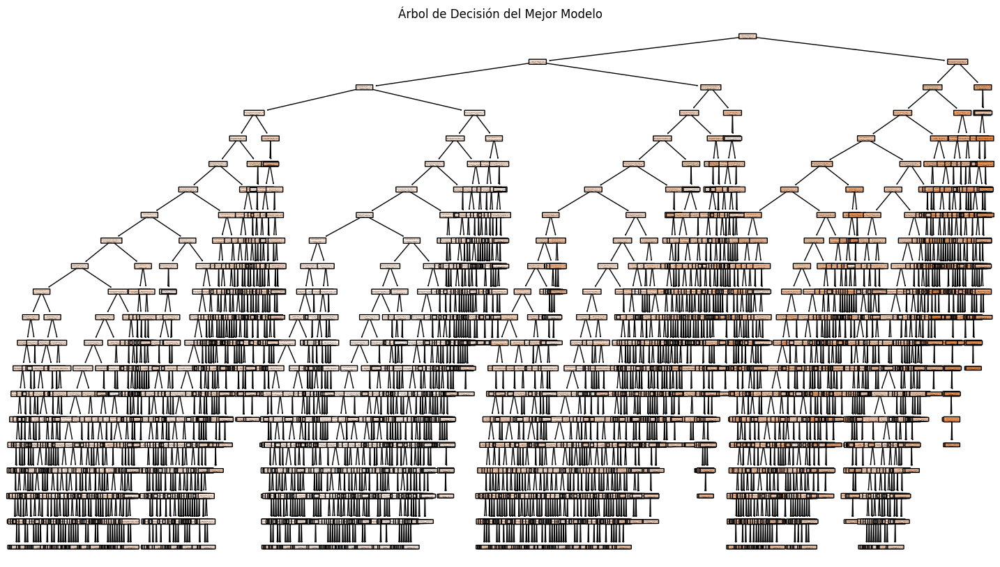

In [74]:
#variables mas influyentes en el modelo
top_features = feature_importances.head(10)
print("Top 10 características más importantes:")
print(top_features)
#vISUALIZAR EL MODELO CON TREEPLOTER
from sklearn.tree import plot_tree
plt.figure(figsize=(18,10))
plot_tree(best_model.estimators_[0], filled=True, feature_names=X_train.columns, rounded=True)
plt.title('Árbol de Decisión del Mejor Modelo')
plt.show()


C:\Users\danad\AppData\Local\Temp\ipykernel_18940\1999310107.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




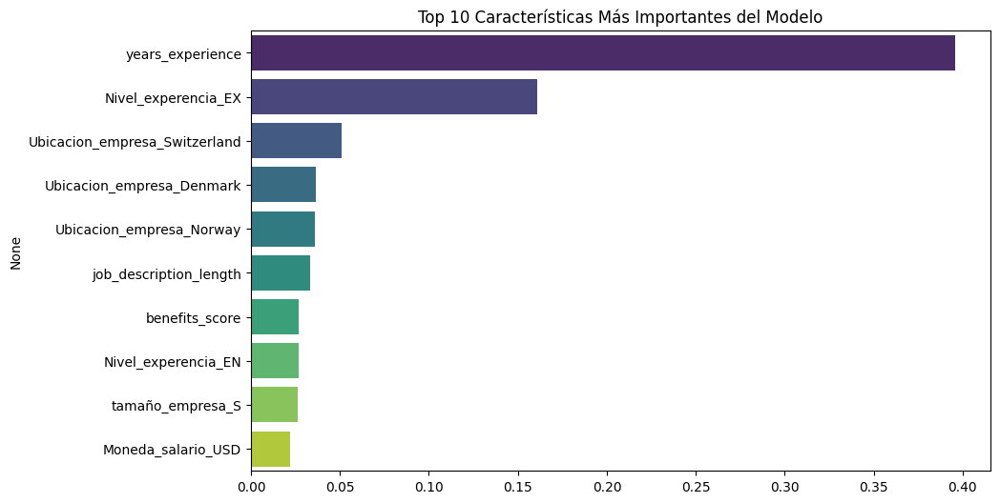

In [75]:
#Visualizar las 1o caarácteristicas mas importantes del modelo con un grafico de barras horizontal
top_features = feature_importances.head(10)
plt.figure(figsize=(10, 6)) 
sns.barplot(x=top_features.values, y=top_features.index, palette='viridis')
plt.title('Top 10 Características Más Importantes del Modelo')
plt.show()


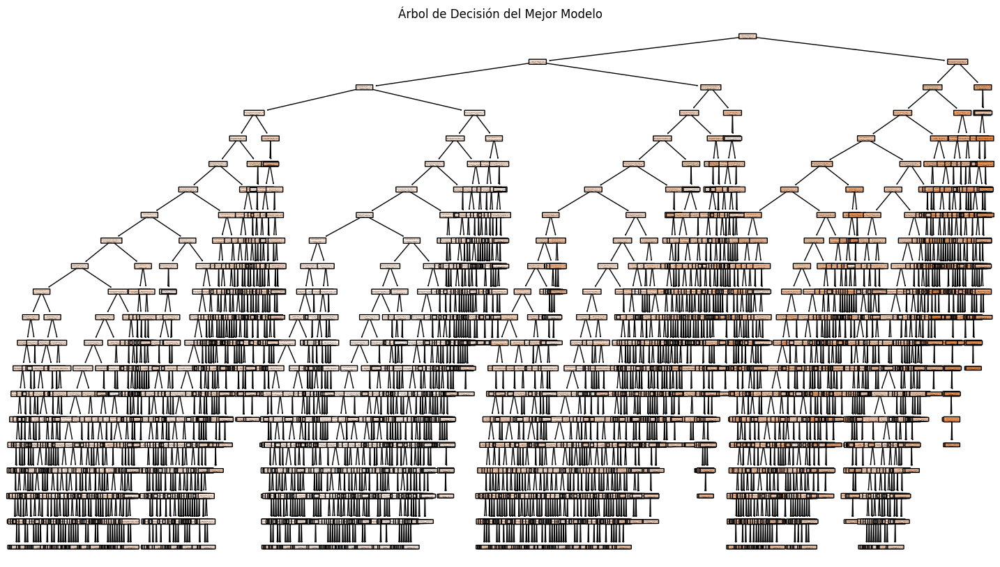

In [50]:
#vISUALIZAR EL MODELO CON TREEPLOTER
from sklearn.tree import plot_tree
plt.figure(figsize=(18,10))
plot_tree(best_model.estimators_[0], filled=True, feature_names=X_train.columns, rounded=True)
plt.title('Árbol de Decisión del Mejor Modelo')
plt.show()
#Para hacerlo mas grande se puede ajustar el figsize